# Importing libraries

In [ ]:
import gdown

# Replace 'FILE_ID' with the actual file ID
file_id = '1jInmoqKsuqnHLHVm43fpV5rO7rJRDzo4'
output = 'acarcarkaxhiadiaconu2324-4-adapt-available-implementation.zip'  # Name of the downloaded file

# Construct the download URL
url = f'https://drive.google.com/uc?id={file_id}'
# Download the file
gdown.download(url, output, quiet=False)

# Unzip the file



Downloading...
From (original): https://drive.google.com/uc?id=1jInmoqKsuqnHLHVm43fpV5rO7rJRDzo4
From (redirected): https://drive.google.com/uc?id=1jInmoqKsuqnHLHVm43fpV5rO7rJRDzo4&confirm=t&uuid=b64591f1-99ac-4291-9a46-cf3984547e85
To: /content/acarcarkaxhiadiaconu2324-4-adapt-available-implementation.zip
100%|██████████| 809M/809M [00:22<00:00, 35.7MB/s]


'acarcarkaxhiadiaconu2324-4-adapt-available-implementation.zip'

In [ ]:
!unzip "acarcarkaxhiadiaconu2324-4-adapt-available-implementation.zip"

Archive:  acarcarkaxhiadiaconu2324-4-adapt-available-implementation.zip
  inflating: acarcarkaxhiadiaconu2324-4-adapt-available-implementation/constants.py  
   creating: acarcarkaxhiadiaconu2324-4-adapt-available-implementation/data/
   creating: acarcarkaxhiadiaconu2324-4-adapt-available-implementation/data/coco/
  inflating: acarcarkaxhiadiaconu2324-4-adapt-available-implementation/data/coco/coco_test_set.py  
  inflating: acarcarkaxhiadiaconu2324-4-adapt-available-implementation/data/coco-FRCNN-vgg16.pth  
   creating: acarcarkaxhiadiaconu2324-4-adapt-available-implementation/data/demo_images/
  inflating: acarcarkaxhiadiaconu2324-4-adapt-available-implementation/data/demo_images/img_0.pt  
  inflating: acarcarkaxhiadiaconu2324-4-adapt-available-implementation/data/demo_images/img_1.pt  
  inflating: acarcarkaxhiadiaconu2324-4-adapt-available-implementation/data/demo_images/img_2.pt  
  inflating: acarcarkaxhiadiaconu2324-4-adapt-available-implementation/data/demo_images/img_3.pt  

In [ ]:
%cd acarcarkaxhiadiaconu2324-4-adapt-available-implementation

/content/acarcarkaxhiadiaconu2324-4-adapt-available-implementation


In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 871.6/871.6 kB 24.4 MB/s eta 0:00:00


In [ ]:
!pip install torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 866.2/866.2 kB 19.2 MB/s eta 0:00:00


In [ ]:
import os

import torch
import torchvision
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.anchor_utils import AnchorGenerator
from torchvision.models.detection.backbone_utils import BackboneWithFPN
import torchvision.transforms as T
from ultralytics import YOLO

import json
import matplotlib.pyplot as plt
import numpy as np
from torchmetrics import Accuracy
from torch.nn.functional import pad
from torchvision.transforms.v2.functional import to_pil_image
from torchvision.utils import draw_bounding_boxes
from tqdm import tqdm


from evaluation.model_evaluation import evaluate_model, compute_metrics
from models.models_utils import frcnn_model_pretrained

#from constants import *
from constants import COCO_CLASSES, VOC_CLASSES

from torchmetrics.detection.mean_ap import MeanAveragePrecision
from torchmetrics import ConfusionMatrix

import torchvision.transforms as T
from PIL import Image
import cv2
import seaborn as sns
from torch import tensor

In [ ]:
DETECTIONS_PER_IMAGE = 500
BOX_SCORE_THRESHOLD = 1e-5  # default 0.05
TOP_K = 100

#VOC dataloader

In [ ]:
import torch
import torchvision

from constants import VOC_CLASSES


def voc_collate_fn(batch):
    images = list()
    boxes = list()
    labels = list()

    for image, annotation in batch:
        images.append(image)

        local_boxes = list()
        local_labels = list()

        for el in annotation["annotation"]["object"]:
            local_boxes.append(el["bndbox"])
            local_labels.append(VOC_CLASSES.index(el["name"]))

        boxes.append(local_boxes)
        labels.append(local_labels)

    targets = []
    images2 = list(image for image in images)

    for x in range(len(images2)):
        dic = {}
        dic['boxes'] = boxes[x]
        dic['labels'] = labels[x]
        targets.append(dic)

    return images2, targets


def get_voc_test_data_loader():
    try:
        dataset = torchvision.datasets.VOCDetection(
            root="data/voc",
            year="2007",
            image_set="test",
            download=False,
            transform=T.ToTensor()
            # transform/target_transform/transforms
        )
    except RuntimeError:
        dataset = torchvision.datasets.VOCDetection(
            root="data/voc",
            year="2007",
            image_set="test",
            download=True,
            transform=T.ToTensor()
            # transform/target_transform/transforms
        )

    return torch.utils.data.DataLoader(
        dataset,
        batch_size=2,
        shuffle=False,
        collate_fn=voc_collate_fn,
        pin_memory=True
    )


In [ ]:
voc_dataloader = get_voc_test_data_loader()

100%|██████████| 451020800/451020800 [00:19<00:00, 23317924.80it/s]


Extracting data/voc/VOCtest_06-Nov-2007.tar to data/voc


#Plotting Functions

In [ ]:
import matplotlib.pyplot as plt

def plot_detections(image_np, pred_boxes, pred_labels, pred_scores, true_boxes, true_labels, threshold=0.5):
    plt.figure(figsize=(12, 8))
    plt.imshow(image_np)
    ax = plt.gca()

    # Plot ground truth boxes
    if true_boxes is not None and true_labels is not None:
        for box, label in zip(true_boxes, true_labels):
            x1, y1, x2, y2 = box.cpu().numpy()
            rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor='green', linewidth=2, linestyle='--')
            ax.add_patch(rect)
            plt.text(x1, y1, f'GT {int(label)}', bbox=dict(facecolor='green', alpha=0.5), fontsize=12, color='white')

    # Plot predicted boxes
    for score, label, box in zip(pred_scores, pred_labels, pred_boxes):
        if score > threshold:
            box = box.cpu().numpy()
            label = int(label.cpu().numpy())
            x1, y1, x2, y2 = box
            rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor='red', linewidth=2)
            ax.add_patch(rect)
            plt.text(x1, y1, f'Pred {label} ({score:.2f})', bbox=dict(facecolor='red', alpha=0.5), fontsize=12, color='white')

    plt.axis('off')
    plt.show()


In [ ]:
def tensor_to_image(tensor):
    # Remove the batch dimension and convert to numpy array
    if tensor.dim() == 4:
        tensor = tensor.squeeze(0)  # Remove batch dimension if present
    image_np = tensor.cpu().numpy()

    # Check number of channels
    if image_np.shape[0] == 1:  # Grayscale image
        image_np = np.squeeze(image_np, axis=0)
        image_np = (image_np - image_np.min()) / (image_np.max() - image_np.min()) * 255
        image_np = image_np.astype(np.uint8)
        image_np = cv2.cvtColor(image_np, cv2.COLOR_GRAY2BGR)
    elif image_np.shape[0] == 3:  # RGB image
        image_np = np.transpose(image_np, (1, 2, 0))  # Change from CHW to HWC format
        image_np = (image_np - image_np.min()) / (image_np.max() - image_np.min()) * 255
        image_np = image_np.astype(np.uint8)
    else:
        raise ValueError("Unsupported image format with {} channels".format(image_np.shape[0]))

    return image_np


In [ ]:
def plot_first_n_images(dataloader, pred_boxes, pred_labels, pred_scores, true_boxes, true_labels, n=10, threshold=0.5):
    image_count = 0
    for batch in dataloader:
        images, _ = batch  # Unpack the batch into images and labels
        for i in range(len(images)):
            if image_count >= n:
                return  # Exit if we have plotted enough images

            img = images[i].cpu()  # Move to CPU for plotting

            # Convert the tensor image to a numpy array
            image_np = tensor_to_image(img)

            # Get the corresponding predictions and ground truth for this image
            img_pred_boxes = pred_boxes[image_count]
            img_pred_labels = pred_labels[image_count]
            img_pred_scores = pred_scores[image_count]
            img_true_boxes = true_boxes[image_count]
            img_true_labels = true_labels[image_count]

            # Plot detections including ground truth
            plot_detections(image_np, img_pred_boxes, img_pred_labels, img_pred_scores, img_true_boxes, img_true_labels)

            image_count += 1


# Metrics Functions

In [ ]:
def mAP(preds, targets):
  # Compute mean average precision
  metric = MeanAveragePrecision(class_metrics = True)
  metric.update(preds, targets)
  map_value = metric.compute()

  return map_value

In [ ]:
def preprocess_labels(preds, targets):

  # Determine the maximum number of labels across all images
  max_length = max(max(len(pred['labels']) for pred in preds), max(len(true['labels']) for true in targets))

  # Define a padding value that does not conflict with existing labels
  padding_value = -1

  # Pad predictions and targets to ensure they have the same length
  padded_preds = []
  padded_targets = []

  for pred, true in zip(preds, targets):
      pred_labels = pred['labels']
      true_labels = true['labels']

      # Pad the labels to the maximum length
      padded_pred_labels = pad(pred_labels, (0, max_length - len(pred_labels)), value=padding_value)
      padded_true_labels = pad(true_labels, (0, max_length - len(true_labels)), value=padding_value)

      padded_preds.extend(padded_pred_labels.tolist())
      padded_targets.extend(padded_true_labels.tolist())

  # Convert lists to tensors
  all_preds_tensor = torch.tensor(padded_preds)
  all_targets_tensor = torch.tensor(padded_targets)

  # Filter out padding values from both predictions and targets
  valid_indices = (all_preds_tensor != padding_value) & (all_targets_tensor != padding_value)
  all_preds_tensor = all_preds_tensor[valid_indices]
  all_targets_tensor = all_targets_tensor[valid_indices]

  return all_preds_tensor, all_targets_tensor

In [ ]:
def accuracy(all_preds_tensor, all_targets_tensor, num_classes):

  # Initialize the Accuracy metric with `average=None` to get per-class accuracy
  accuracy = Accuracy(task='multiclass', num_classes=num_classes, average=None)

  # Compute the accuracy for each class
  per_class_accuracy = accuracy(all_preds_tensor, all_targets_tensor)

  # Print the accuracy for each class
  for i, acc in enumerate(per_class_accuracy):
      print(f"Accuracy for class {i}: {acc.item() * 100:.2f}%")

In [ ]:
def conf_matrix(all_preds_tensor, all_targets_tensor, num_classes):

  # Initialize the ConfusionMatrix metric
  confmat = ConfusionMatrix(task='multiclass', num_classes=num_classes)

  # Compute the confusion matrix
  confusion_matrix_result = confmat(all_preds_tensor, all_targets_tensor)

  # Print the confusion matrix
  cm = confusion_matrix_result.cpu().numpy()  # Convert to NumPy array for plotting

# Plot the confusion matrix
  plt.figure(figsize=(10, 10))
  sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
  plt.ylabel("Actual")
  plt.xlabel("Predicted")
  plt.title("Confusion Matrix")
  plt.show()

#Knowledge Injection functions

In [ ]:
def find_p_hat(boxes, predictions, bk, lk, S, num_iterations, epsilon):
    num_boxes = predictions.shape[0]
    num_classes = predictions.shape[1]

    if num_boxes <= 1:
        return predictions

    if num_boxes <= bk:
        bk = num_boxes - 1

    if num_classes <= lk:
        lk = num_classes

    box_centers = torch.empty(size=(num_boxes, 2), dtype=torch.double).to(device)
    box_centers[:, 0] = ((boxes[:, 2] - boxes[:, 0]) / 2) + boxes[:, 0]
    box_centers[:, 1] = ((boxes[:, 3] - boxes[:, 1]) / 2) + boxes[:, 1]

    box_nearest = torch.empty(size=(num_boxes, bk), dtype=torch.long).to(device)
    for i in range(len(boxes)):
        box_center = box_centers[i]
        distances = torch.sqrt((box_center[0] - box_centers[:, 0]) ** 2 + (box_center[1] - box_centers[:, 1]) ** 2)
        distances[i] = float('inf')
        box_nearest[i] = torch.argsort(distances)[0:bk]

    S_highest = torch.zeros(size=(num_classes, num_classes), dtype=torch.double).to(device)
    for i in range(len(S)):
        S_args = torch.argsort(S[i])[-lk:]
        S_highest[i, S_args] = S[i, S_args]

    p_hat_init = torch.full(size=(num_boxes, num_classes), fill_value=(1 / num_classes), dtype=torch.double).to(device)
    p_hat = p_hat_init

    # Debugging: Print initial values
    #print(f"Initial p_hat:\n{p_hat}")

    for i in range(num_iterations):
        p_hat_temp = torch.clone(p_hat)
        for b in range(num_boxes):
            p = predictions[b]
            num = torch.sum(torch.mm(S_highest, torch.transpose(p_hat_temp[box_nearest[b]], 0, 1)), 1)
            denom = torch.sum(S_highest, dim=1) * bk
            p_hat[b] = (1 - epsilon) * torch.squeeze(torch.div(num, denom)) + epsilon * p
            p_hat[b] = torch.nan_to_num(p_hat[b])

        # Debugging: Print p_hat after each iteration
        #print(f"p_hat after iteration {i+1}:\n{p_hat}")

    return p_hat


def find_top_k(predictions, boxes, k):
    """
    Find the top k highest scoring predictions
    :param predictions: tensor of prediction scores
    :param boxes: tensor of bounding boxes
    :param k: (maximum) number of object to return
    :return predictions2: k amount of highest scoring predictions
    :return boxes2: k amount of bounding boxes corresponding to the highest scoring predictions
    :return labels2: k amount of labels corresponding to the highest scoring predictions
    :return scores2: k amount of scores corresponding to the highest scoring predictions
    """

    if predictions.shape[0] == 0:
        predictions2 = torch.Tensor([]).to(device)
        labels2 = torch.Tensor([]).to(device)
        boxes2 = torch.Tensor([]).to(device)
        scores2 = torch.Tensor([]).to(device)

    else:
        predictions0 = predictions
        scores0 = torch.max(predictions0, dim=1)[0]
        labels0 = torch.argmax(predictions0, dim=1)
        boxes0 = boxes

        sort = torch.argsort(scores0, descending=True)
        boxes1, labels1, scores1, predictions1 = boxes0[sort], labels0[sort], scores0[sort], predictions0[sort]

        boxes2, labels2, scores2, predictions2 = boxes1[:k], labels1[:k]+1, scores1[:k], predictions1[:k]

    return predictions2, boxes2, labels2, scores2

## Loading the consistency matrix

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
num_iters = 10                 # number of iterations to calculate p_hat
bk = 5                         # number of neighbouring bounding boxes to consider for p_hat
lk = 5                         # number of largest semantic consistent classes to consider for p_hat
epsilon = 1                # trade-off parameter for traditional detections and knowledge aware detections
topk = 100
#model_type = 'voc-FRCNN-resnet50'   # choose between 'voc-FRCNN-resnet50', 'voc-FRCNN-resnet18' or 'voc-FRCNN-vgg16'
matrix_type = 'KG-CNet-57-VOC'      # choose between 'KF-All-VOC', 'KF-500-VOC', 'KG-CNet-57-VOC' or 'KG-CNet-55-VOC'

# load in consistency matrix

path_project = "/content/acarcarkaxhiadiaconu2324-4-adapt-available-implementation"
file_path = os.path.join(path_project, "Semantic Consistency/CM_kg_57_info.json")

if os.path.isfile(file_path):
        print("Loading knowledge based consistency matrix")
        with open(file_path, 'r') as j:
            info = json.load(j)
        KG_VOC_info = info['KG_VOC_info']
        S_KG_57_VOC = np.asarray(KG_VOC_info['S'])
else:
        print("No matrix available")


if matrix_type == 'KG-CNet-57-VOC':
        S = torch.from_numpy(S_KG_57_VOC).to(device)

else:
        print("Wrong matrix type selected")

Loading knowledge based consistency matrix


# Fast-RCNN

In [ ]:
#coco_model = frcnn_model_pretrained("COCO", device)
voc_model = frcnn_model_pretrained("VOC", device)
voc_model.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
      (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (6): ReLU(inplace=True)
      (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (8): ReLU(inplace=True)
      (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (11): ReLU(inplace=True)
      (12): Conv2d(256, 256, 

##Fast-RCNN without KG

###Model evaluation function

In [ ]:
from torchvision.ops import nms
def evaluate_standard_model(model, test_loader, num_classes, device):

  pred_boxes = []
  pred_labels = []
  pred_scores = []
  true_boxes = []
  true_labels = []

  with torch.no_grad():
      for images, targets in tqdm(test_loader):


          # Move to default device.
          images = [im.to(device) for im in images]

          # Some (1021) images of COCO contain no objects at all.  These are filtered out in the data loader, but
          # return an empty list, which raises an error in the model, so they are skipped.
          if len(images) == 0:
            continue

          prediction = model(images)

          for p in range(len(prediction)):

            true_boxes.append(torch.Tensor([list(int(y) for y in i.values()) for i in targets[p]['boxes']]).to("cpu"))
            true_labels.append(torch.Tensor(targets[p]['labels']).to("cpu"))


            boxes = prediction[p]['boxes'].to("cpu")
            labels = (prediction[p]['labels']-1).to("cpu")
            scores = prediction[p]['scores'].to("cpu")

            # Apply confidence thresholding
            # mask = scores >= 0.2
            # boxes = boxes[mask]
            # labels = labels[mask]
            # scores = scores[mask]

            # # Apply NMS
            # keep = nms(boxes, scores, iou_threshold=0.5)
            # boxes = boxes[keep]
            # labels = labels[keep]
            # scores = scores[keep]

            # # Store the results
            # pred_boxes.append(boxes.flip(0))
            # pred_labels.append(labels.flip(0))
            # pred_scores.append(scores.flip(0))

            pred_boxes.append(boxes)
            pred_labels.append(labels)
            pred_scores.append(scores)



          del prediction
          del images
          torch.cuda.empty_cache()

  return pred_boxes, pred_labels, pred_scores, true_boxes, true_labels

In [ ]:
pred_boxes, pred_labels, pred_scores, true_boxes, true_labels = evaluate_standard_model(voc_model, voc_dataloader, len(VOC_CLASSES), device)

100%|██████████| 2476/2476 [25:55<00:00,  1.59it/s]


In [ ]:
print("predicted_box: ", pred_boxes[0], "\npredicted_label: ", pred_labels[0], "\npredicted_score: ", pred_scores[0], "\ntrue_box: ", true_boxes[0], "\ntrue_label: ", true_labels[0])

predicted_box:  tensor([[ 70.2937,  11.7238, 353.0000, 376.8212],
        [ 22.7823,   0.0000, 276.5512, 485.8404],
        [ 50.7079, 214.1015, 224.3547, 392.2198],
        [112.2496,  96.2924, 289.0090, 220.7147],
        [  8.8002, 225.4131, 130.2496, 472.3369],
        [125.9418,   6.8250, 313.0547, 263.8727],
        [ 60.6488, 184.1978, 279.5490, 452.3960],
        [ 12.4822, 168.2756, 353.0000, 500.0000],
        [ 56.6471, 210.8336, 294.2144, 473.0769],
        [ 60.8707, 177.5772, 282.1821, 473.4851],
        [ 68.0433, 201.8893, 210.0081, 377.7235],
        [ 57.7577, 180.9101, 232.1281, 403.8415],
        [ 70.4087, 181.9221, 348.2627, 445.3733],
        [ 30.1971,   0.0000, 208.5354, 331.7646],
        [ 58.1601, 106.1863, 338.6427, 489.3466]]) 
predicted_label:  tensor([14, 14, 11, 15, 14, 14, 11, 17,  7,  2,  2, 14, 14, 14,  8]) 
predicted_score:  tensor([0.9995, 0.8983, 0.5214, 0.3123, 0.3014, 0.1969, 0.1364, 0.1300, 0.0870, 0.0670, 0.0448, 0.0283, 0.0147, 0.0114, 0.0110

###Fast-RCNN without KG Error Analysis

In [ ]:
# Construct preds and target
preds = []
targets = []

for box, score, label in zip(pred_boxes, pred_scores, pred_labels):
    preds.append(
        dict(
            boxes=box,
            scores=score,
            labels=label.int(),
        )
    )


for box, label in zip(true_boxes, true_labels):
    targets.append(
        dict(
            boxes=box,
            labels=label.int(),
        )
    )

In [ ]:
mAP(preds, targets)

{'map': tensor(0.2510),
 'map_50': tensor(0.5485),
 'map_75': tensor(0.1840),
 'map_small': tensor(0.0654),
 'map_medium': tensor(0.1686),
 'map_large': tensor(0.3063),
 'mar_1': tensor(0.2628),
 'mar_10': tensor(0.4040),
 'mar_100': tensor(0.4125),
 'mar_small': tensor(0.1433),
 'mar_medium': tensor(0.3217),
 'mar_large': tensor(0.4814),
 'map_per_class': tensor([0.2596, 0.3207, 0.1935, 0.1278, 0.1696, 0.3158, 0.3928, 0.3007, 0.1165, 0.2732, 0.1806, 0.2336, 0.3486, 0.3308, 0.3113, 0.1011, 0.2532, 0.1931, 0.2856, 0.3113]),
 'mar_100_per_class': tensor([0.3987, 0.4504, 0.3465, 0.2959, 0.2915, 0.4783, 0.4944, 0.4814, 0.2795, 0.4605, 0.3783, 0.4587, 0.4795, 0.4683, 0.4426, 0.2758, 0.4080, 0.4520, 0.4656, 0.4446]),
 'classes': tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19], dtype=torch.int32)}

In [ ]:
all_preds_tensor, all_targets_tensor = preprocess_labels(preds, targets)

In [ ]:
accuracy(all_preds_tensor, all_targets_tensor, 20)

Accuracy for class 0: 74.18%
Accuracy for class 1: 40.87%
Accuracy for class 2: 68.23%
Accuracy for class 3: 69.55%
Accuracy for class 4: 46.12%
Accuracy for class 5: 44.09%
Accuracy for class 6: 69.18%
Accuracy for class 7: 70.54%
Accuracy for class 8: 43.80%
Accuracy for class 9: 67.48%
Accuracy for class 10: 15.72%
Accuracy for class 11: 51.51%
Accuracy for class 12: 37.72%
Accuracy for class 13: 46.07%
Accuracy for class 14: 69.97%
Accuracy for class 15: 58.11%
Accuracy for class 16: 66.56%
Accuracy for class 17: 34.34%
Accuracy for class 18: 76.82%
Accuracy for class 19: 46.81%


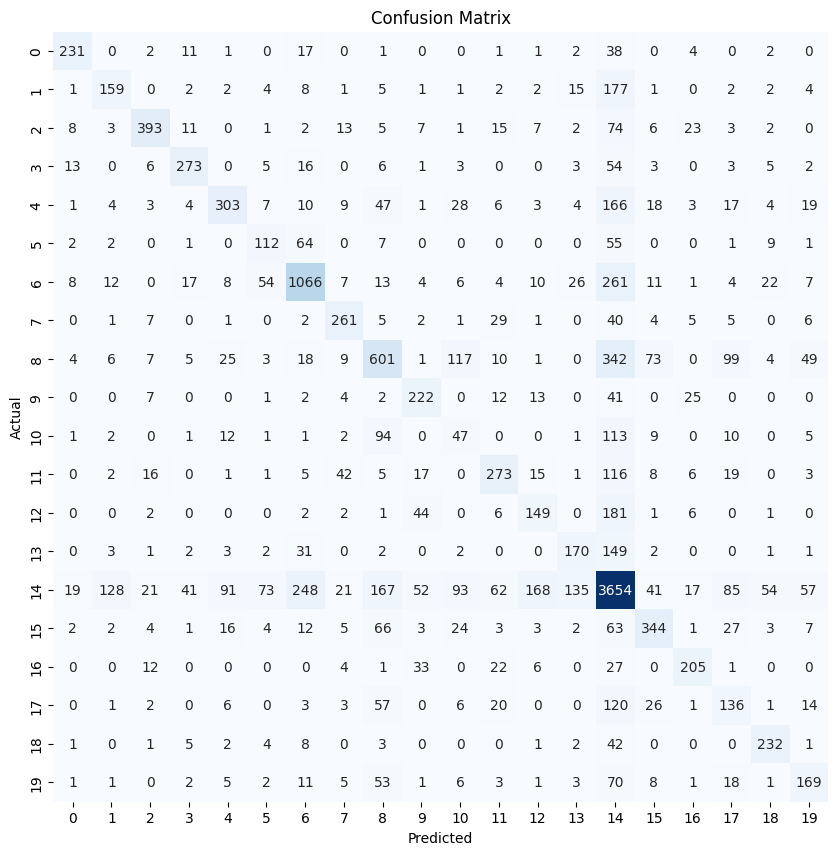

In [ ]:
# Compute the confusion matrix
conf_matrix(all_preds_tensor, all_targets_tensor, 20)

### Plotting predicted and GT detections

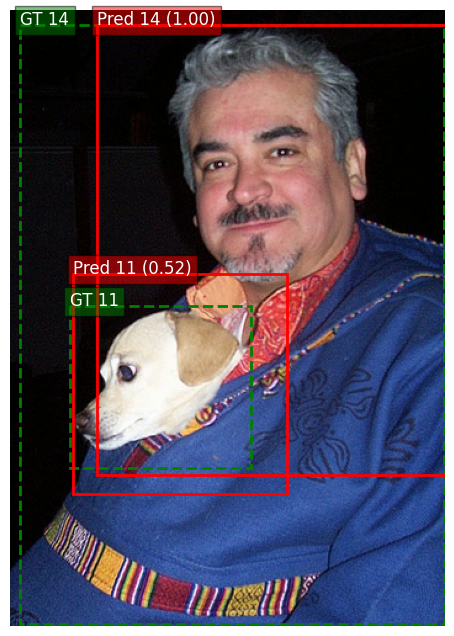

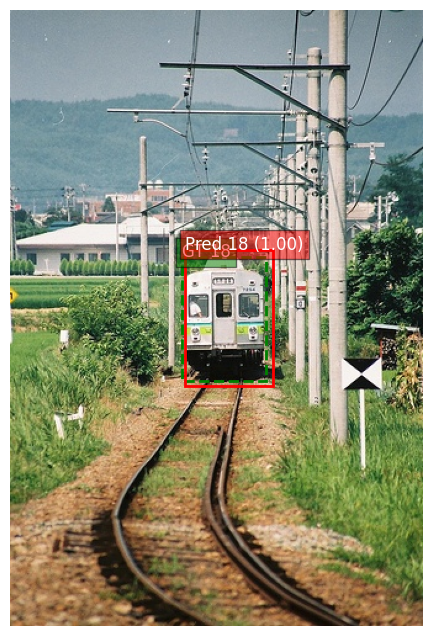

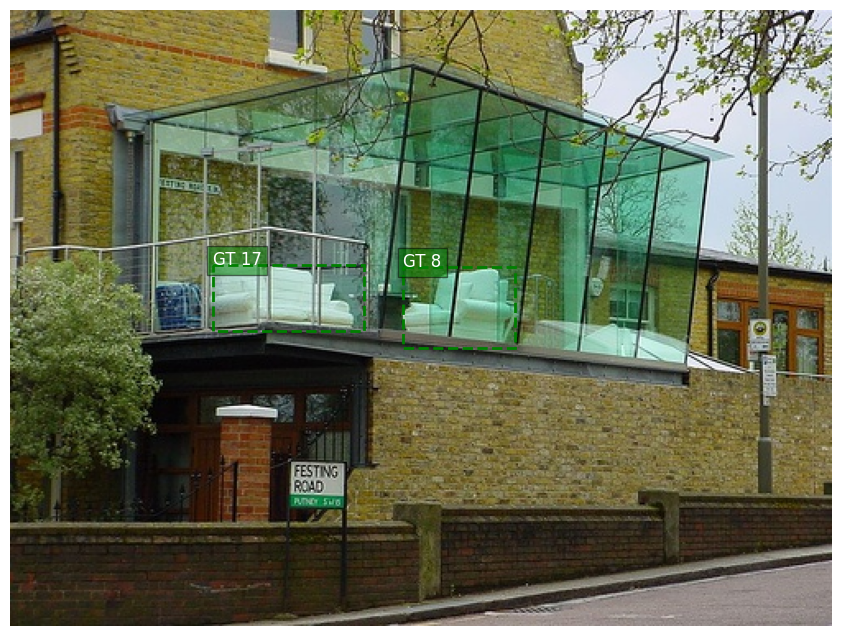

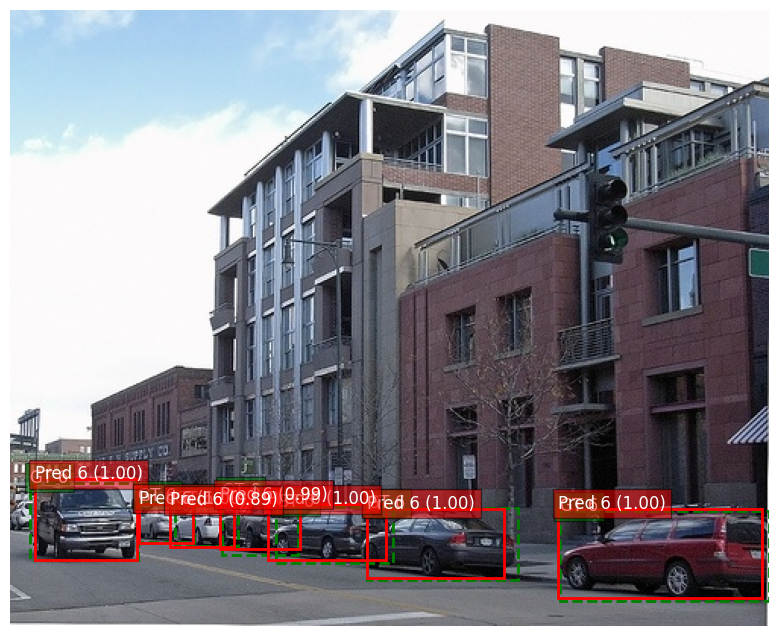

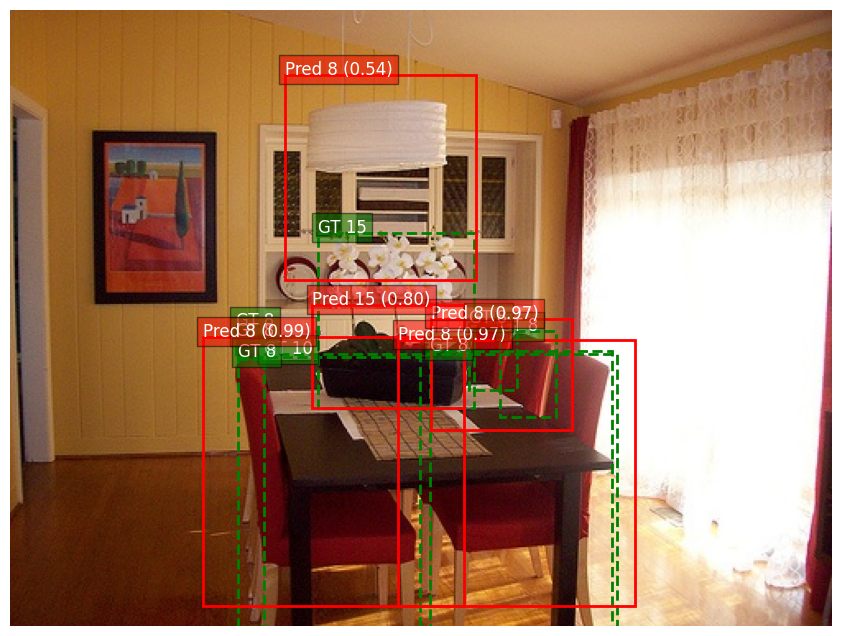

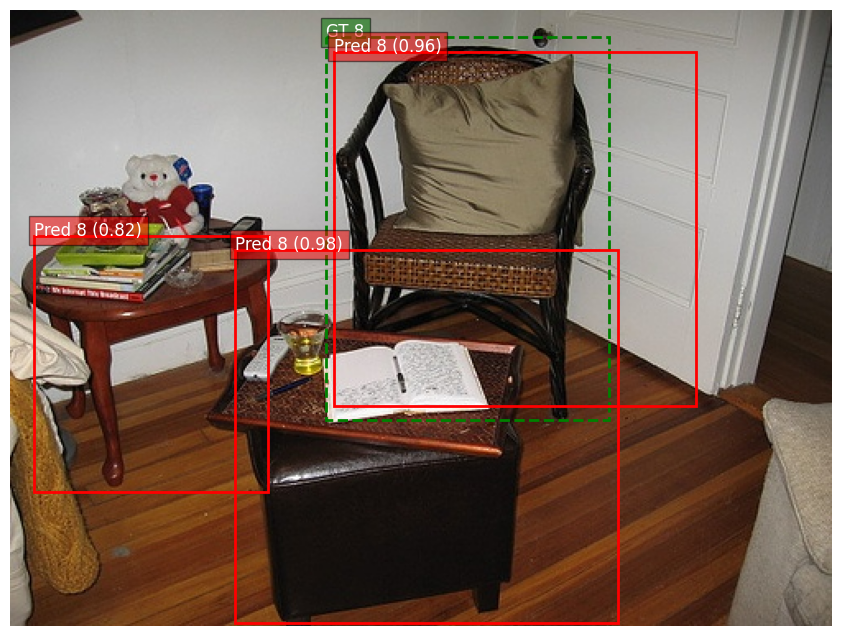

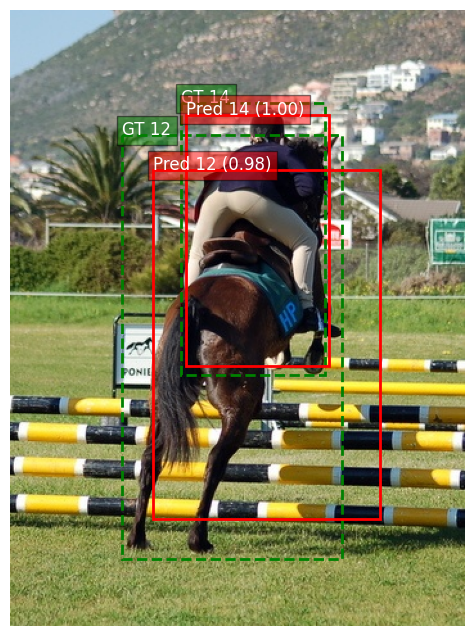

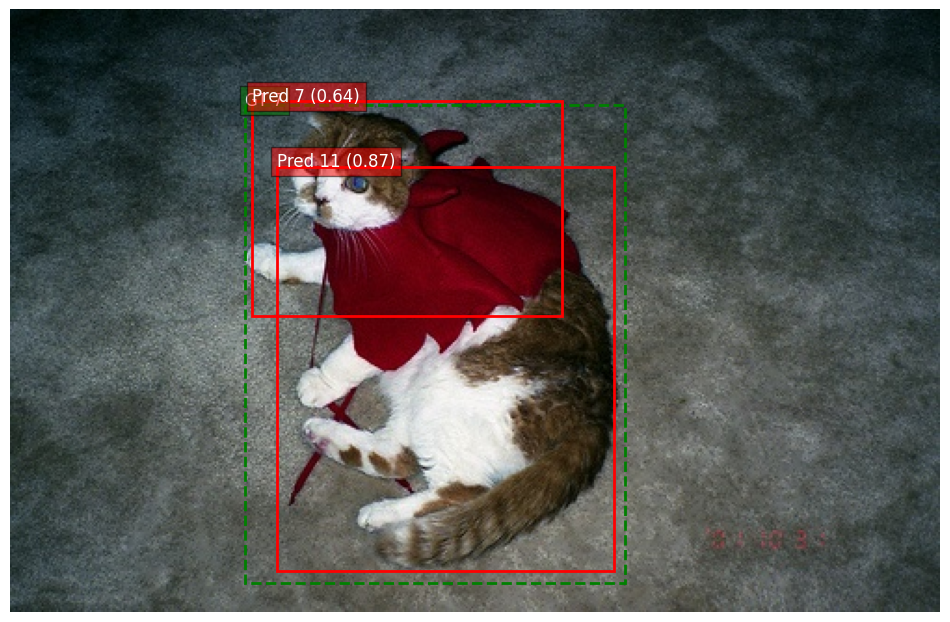

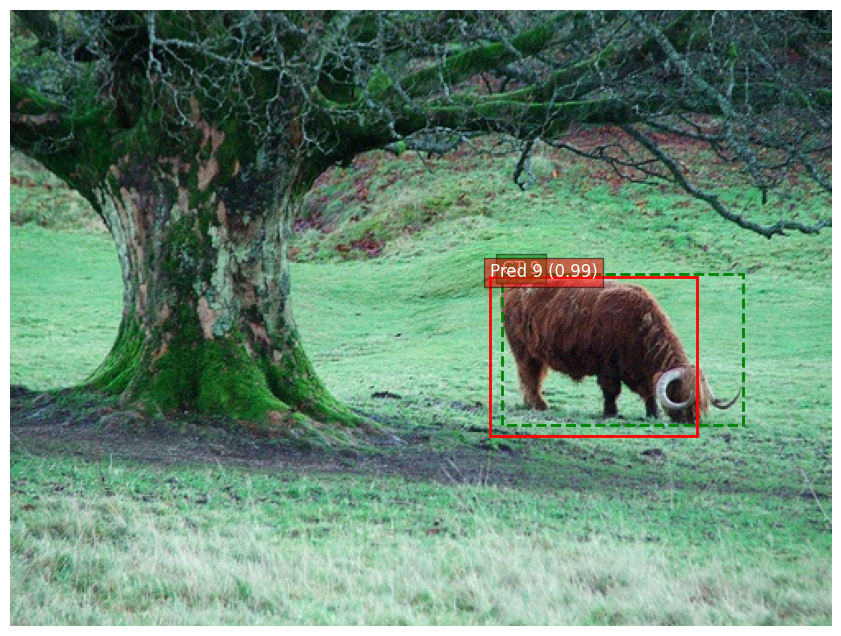

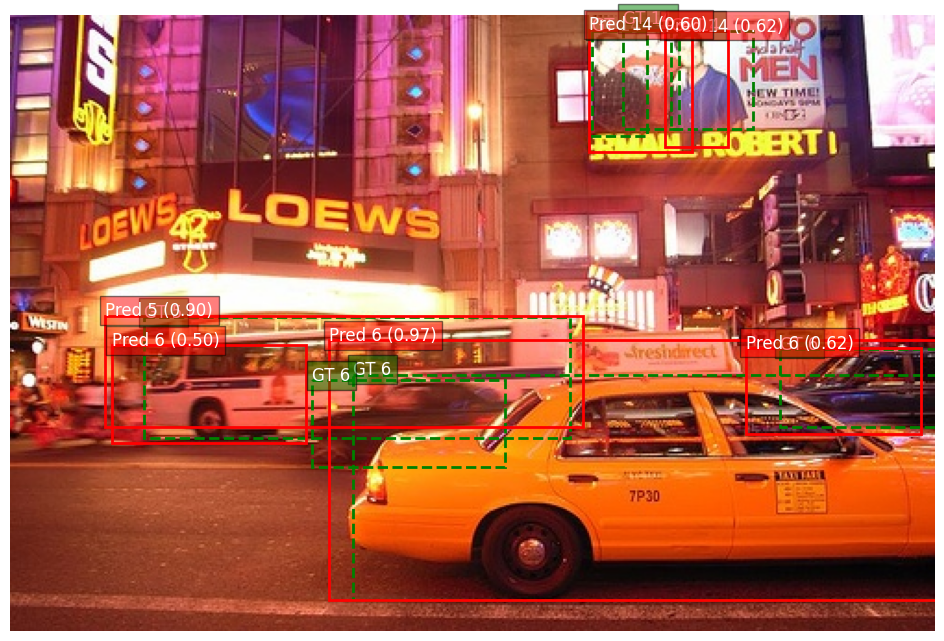

In [ ]:
plot_first_n_images(voc_dataloader, pred_boxes, pred_labels, pred_scores, true_boxes, true_labels, n=10, threshold=0.5)

## Fast-RCNN with Knowledge Injection

###Evaluation function of the Fast-RCNN with KG

In [ ]:
def evaluate_standard_model_kg(model, test_loader, num_classes, device, bk, lk, S, num_iters, epsilon, topk):
    pred_boxes = []
    pred_labels = []
    pred_scores = []
    true_boxes = []
    true_labels = []
    i = 0
    with torch.no_grad():
        for images, targets in tqdm(test_loader):

          # Move images to the device
          images = [im.to(device) for im in images]

          # Skip images with no objects
          if len(images) == 0:
              continue

          # Get predictions from the model
          prediction = model(images)

          for p in range(len(prediction)):
              # Append true boxes and labels
              true_boxes.append(torch.Tensor([list(int(y) for y in i.values()) for i in targets[p]['boxes']]).to("cpu"))
              true_labels.append((torch.Tensor(targets[p]['labels'])+1).to("cpu"))

              # Get predicted boxes, labels, and scores
              pred_boxes_temp = prediction[p]['boxes'].to(device)
              pred_labels_temp = (prediction[p]['labels'] - 1).to(device)
              pred_scores_temp = prediction[p]['scores'].to(device)

              # Initialize new_predictions tensor for knowledge-aware processing
              new_predictions = torch.zeros((pred_boxes_temp.shape[0], num_classes)).to(device)
              for l in range(pred_boxes_temp.shape[0]):
                  label = pred_labels_temp[l].item()
                  new_predictions[l, label] = pred_scores_temp[l]

              # Compute knowledge-aware predictions using the consistency matrix
              p_hat = find_p_hat(pred_boxes_temp, new_predictions, bk, lk, S, num_iters, epsilon)

              # Find top-k predictions based on their scores
              predk, boxk, labk, scok = find_top_k(p_hat, pred_boxes_temp, topk)

              # Append processed predictions
              pred_boxes.append(boxk.to("cpu"))
              pred_labels.append(labk.to("cpu"))
              pred_scores.append(scok.to("cpu"))
        # Clean up memory
        del prediction
        del images
        torch.cuda.empty_cache()

    return pred_boxes, pred_labels, pred_scores, true_boxes, true_labels

In [ ]:
pred_boxes_kg, pred_labels_kg, pred_scores_kg, true_boxes, true_labels = evaluate_standard_model_kg(voc_model, voc_dataloader, len(VOC_CLASSES), device, bk, lk, S, num_iters, epsilon, topk)

100%|██████████| 2476/2476 [30:46<00:00,  1.34it/s]


In [ ]:
print("predicted_box: ", pred_boxes_kg[0], "\npredicted_label: ", pred_labels_kg[0], "\npredicted_score: ", pred_scores_kg[0], "\ntrue_box: ", true_boxes[0], "\ntrue_label: ", true_labels[0])

predicted_box:  tensor([[ 70.2937,  11.7238, 353.0000, 376.8212],
        [ 22.7823,   0.0000, 276.5512, 485.8404],
        [ 50.7079, 214.1015, 224.3547, 392.2198],
        [112.2496,  96.2924, 289.0090, 220.7147],
        [  8.8002, 225.4131, 130.2496, 472.3369],
        [125.9418,   6.8250, 313.0547, 263.8727],
        [ 60.6488, 184.1978, 279.5490, 452.3960],
        [ 12.4822, 168.2756, 353.0000, 500.0000],
        [ 56.6471, 210.8336, 294.2144, 473.0769],
        [ 60.8707, 177.5772, 282.1821, 473.4851],
        [ 68.0433, 201.8893, 210.0081, 377.7235],
        [ 57.7577, 180.9101, 232.1281, 403.8415],
        [ 70.4087, 181.9221, 348.2627, 445.3733],
        [ 30.1971,   0.0000, 208.5354, 331.7646],
        [ 58.1601, 106.1863, 338.6427, 489.3466]]) 
predicted_label:  tensor([15, 15, 12, 16, 15, 15, 12, 18,  8,  3,  3, 15, 15, 15,  9]) 
predicted_score:  tensor([0.9995, 0.8983, 0.5214, 0.3123, 0.3014, 0.1969, 0.1364, 0.1300, 0.0870, 0.0670, 0.0448, 0.0283, 0.0147, 0.0114, 0.0110

### Fast-RCNN KG Error Analysis

In [ ]:
# Construct preds and target
preds_kg = []
targets_kg = []

for box, score, label in zip(pred_boxes_kg, pred_scores_kg, pred_labels_kg):
    preds_kg.append(
        dict(
            boxes=box,
            scores=score,
            labels=label.int(),
        )
    )


for box, label in zip(true_boxes, true_labels):
    targets_kg.append(
        dict(
            boxes=box,
            labels=label.int(),
        )
    )

In [ ]:
mAP(preds_kg, targets_kg)

{'map': tensor(0.2510),
 'map_50': tensor(0.5485),
 'map_75': tensor(0.1840),
 'map_small': tensor(0.0654),
 'map_medium': tensor(0.1686),
 'map_large': tensor(0.3063),
 'mar_1': tensor(0.2628),
 'mar_10': tensor(0.4040),
 'mar_100': tensor(0.4125),
 'mar_small': tensor(0.1433),
 'mar_medium': tensor(0.3216),
 'mar_large': tensor(0.4814),
 'map_per_class': tensor([0.2596, 0.3207, 0.1935, 0.1278, 0.1694, 0.3158, 0.3928, 0.3007, 0.1165, 0.2732, 0.1806, 0.2336, 0.3486, 0.3308, 0.3113, 0.1011, 0.2532, 0.1931, 0.2856, 0.3113]),
 'mar_100_per_class': tensor([0.3987, 0.4504, 0.3465, 0.2959, 0.2907, 0.4783, 0.4944, 0.4814, 0.2795, 0.4605, 0.3783, 0.4587, 0.4795, 0.4683, 0.4426, 0.2758, 0.4080, 0.4520, 0.4656, 0.4446]),
 'classes': tensor([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20], dtype=torch.int32)}

In [ ]:
all_preds_tensor_kg, all_targets_tensor_kg = preprocess_labels(preds_kg, targets_kg)

In [ ]:
accuracy(all_preds_tensor_kg-1, all_targets_tensor_kg-1, 20)

Accuracy for class 0: 74.18%
Accuracy for class 1: 40.87%
Accuracy for class 2: 68.23%
Accuracy for class 3: 69.55%
Accuracy for class 4: 46.12%
Accuracy for class 5: 44.09%
Accuracy for class 6: 69.18%
Accuracy for class 7: 70.54%
Accuracy for class 8: 43.80%
Accuracy for class 9: 67.48%
Accuracy for class 10: 15.72%
Accuracy for class 11: 51.51%
Accuracy for class 12: 37.72%
Accuracy for class 13: 46.07%
Accuracy for class 14: 69.97%
Accuracy for class 15: 58.11%
Accuracy for class 16: 66.56%
Accuracy for class 17: 34.34%
Accuracy for class 18: 76.82%
Accuracy for class 19: 46.81%


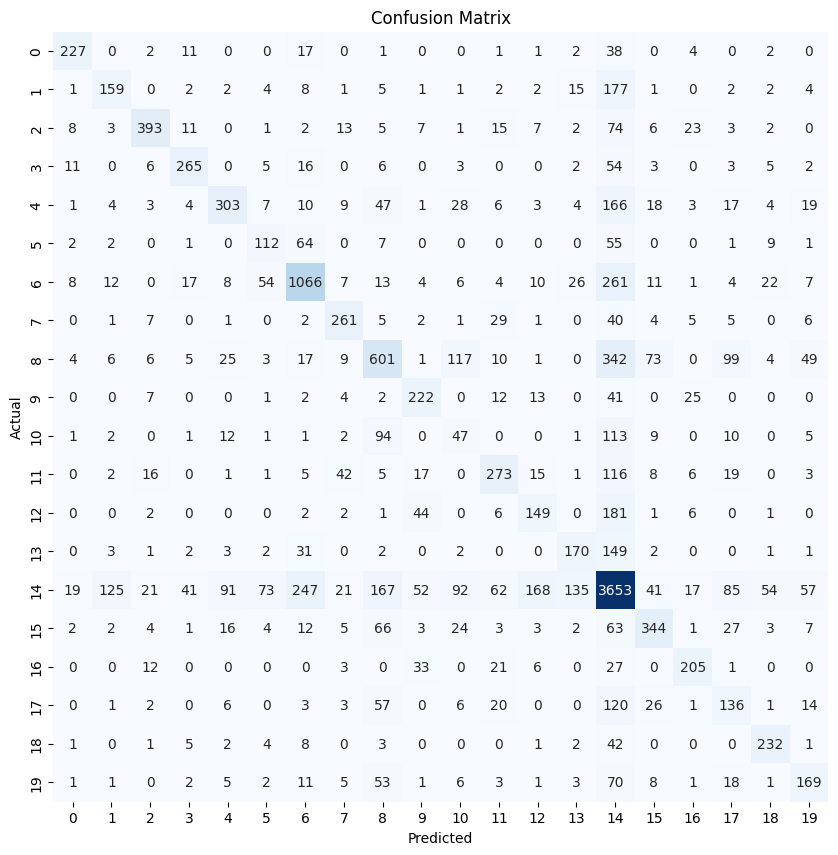

In [ ]:
conf_matrix(all_preds_tensor_kg-1, all_targets_tensor_kg-1, 20)

# YOLOv8

##Yolo prediction examples

In [ ]:
import cv2
from PIL import Image

def yolo_prediction(dataset, device):

    model = YOLO("yolov8n.pt")
    #model.eval()

    for i in range(10):
        img = torch.load("/content/acarcarkaxhiadiaconu2324-4-adapt-available-implementation/data/demo_images/img_" + str(i) + ".pt")
        img = img.to(torch.float32).to(device)

        # Make prediction with YOLO
        results = model(img.unsqueeze(0))  # Add batch
        # Visualize the results
        for i, r in enumerate(results):
              # Plot results image
              im_bgr = r.plot()  # BGR-order numpy array
              im_rgb = Image.fromarray(im_bgr[..., ::-1])  # RGB-order PIL image


              plt.imshow(im_bgr)
              plt.show()


    return None


0: 224x224 1 person, 1 dog, 8.8ms
Speed: 0.0ms preprocess, 8.8ms inference, 1.6ms postprocess per image at shape (1, 3, 224, 224)


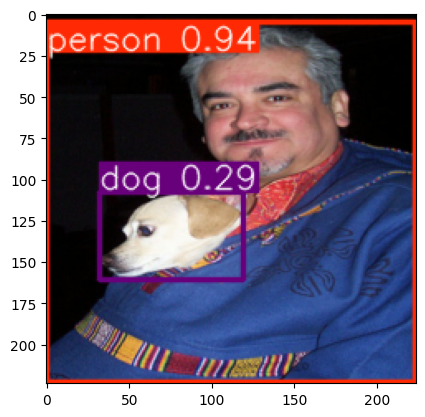


0: 224x224 1 train, 8.9ms
Speed: 0.0ms preprocess, 8.9ms inference, 1.9ms postprocess per image at shape (1, 3, 224, 224)


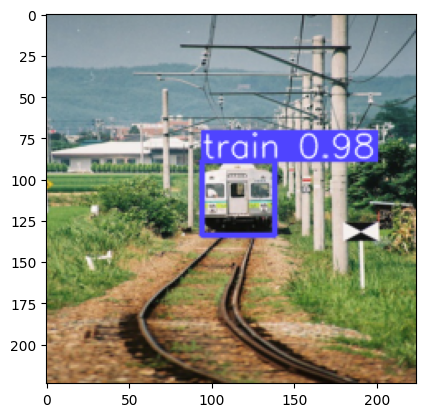


0: 224x224 (no detections), 14.5ms
Speed: 0.0ms preprocess, 14.5ms inference, 1.0ms postprocess per image at shape (1, 3, 224, 224)


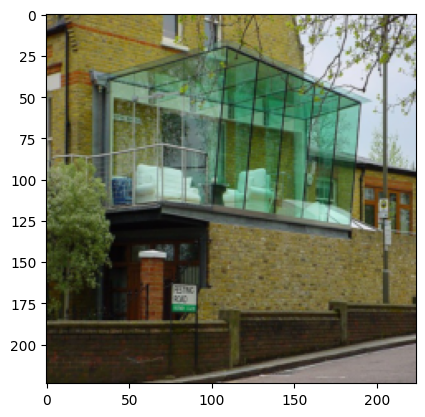


0: 224x224 9 cars, 1 truck, 1 traffic light, 11.2ms
Speed: 0.0ms preprocess, 11.2ms inference, 3.9ms postprocess per image at shape (1, 3, 224, 224)


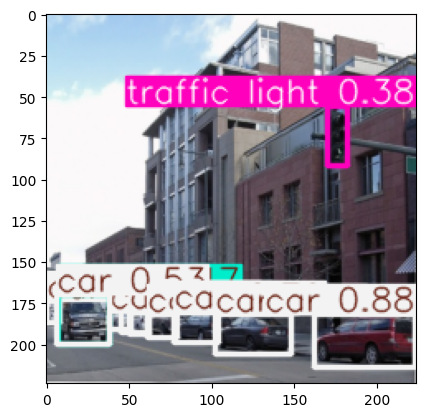


0: 224x224 1 chair, 1 dining table, 12.3ms
Speed: 0.0ms preprocess, 12.3ms inference, 2.1ms postprocess per image at shape (1, 3, 224, 224)


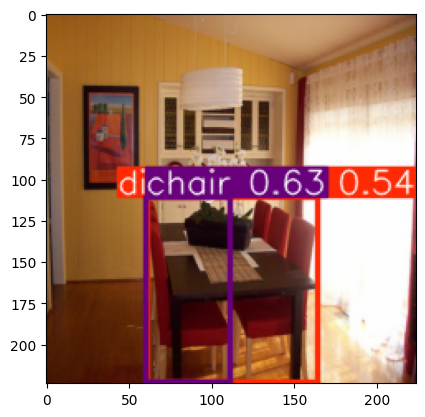


0: 224x224 1 chair, 11.4ms
Speed: 0.0ms preprocess, 11.4ms inference, 6.0ms postprocess per image at shape (1, 3, 224, 224)


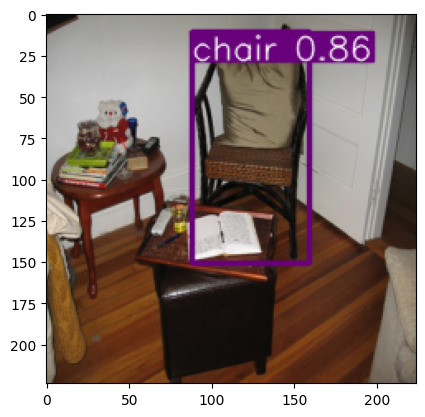


0: 224x224 1 person, 1 horse, 15.0ms
Speed: 0.0ms preprocess, 15.0ms inference, 1.6ms postprocess per image at shape (1, 3, 224, 224)


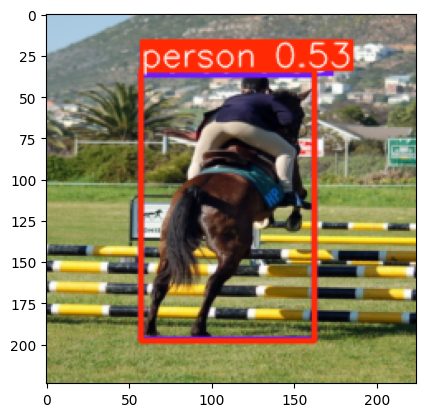


0: 224x224 1 dog, 14.6ms
Speed: 0.0ms preprocess, 14.6ms inference, 2.0ms postprocess per image at shape (1, 3, 224, 224)


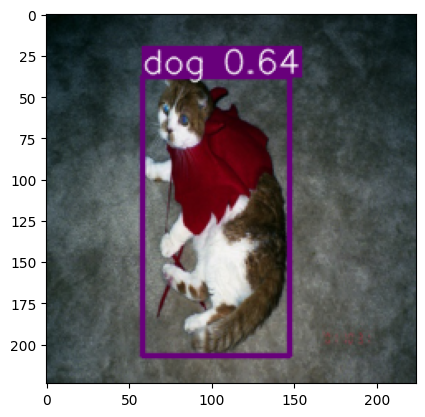


0: 224x224 1 cow, 9.5ms
Speed: 0.0ms preprocess, 9.5ms inference, 1.9ms postprocess per image at shape (1, 3, 224, 224)


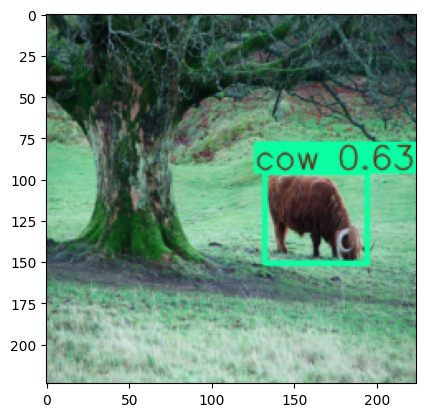


0: 224x224 3 cars, 13.3ms
Speed: 0.0ms preprocess, 13.3ms inference, 1.8ms postprocess per image at shape (1, 3, 224, 224)


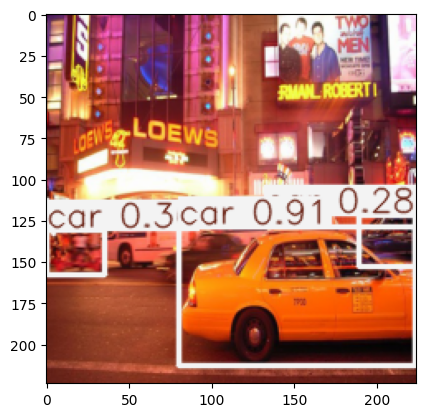

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

yolo_prediction("COCO", device)

##Yolo standard predictions

In [ ]:
yolo_model = YOLO("yolov8n.pt")
yolo_model.eval()

Ultralytics YOLOv8.2.79 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=coco.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, lin

100%|██████████| 755k/755k [00:00<00:00, 2.28MB/s]



                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

train: Scanning /content/acarcarkaxhiadiaconu2324-4-adapt-available-implementation/datasets/coco/labels/train2017... 0 images, 0 backgrounds, 118287 corrupt: 100%|██████████| 118287/118287 [00:08<00:00, 13264.78it/s]


##Yolo evaluation function

In [ ]:
from PIL import Image
import numpy as np
from ultralytics import YOLO

def tensor_to_pil(tensor):
    return T.ToPILImage()(tensor).convert("RGB")

def dict_to_numpy_box(box_dict):
    return np.array([box_dict['xmin'], box_dict['ymin'], box_dict['xmax'], box_dict['ymax']], dtype=np.float32)

def evaluate_model(model, dataloader, confidence_threshold=1e-05):
    results = []

    with torch.no_grad():  # Disable gradient calculation
        for images, targets in dataloader:
            # Convert tensor images to numpy arrays
            pil_images = [tensor_to_pil(image) for image in images]

            # Run inference
            outputs = model.predict(pil_images, conf=confidence_threshold)

            for i, output in enumerate(outputs):
                pred_boxes = output.boxes.xyxy.cpu().numpy()  # Predicted boxes in [x1, y1, x2, y2] format
                pred_scores = output.boxes.conf.cpu().numpy()  # Confidence scores
                pred_labels = output.boxes.cls.cpu().numpy()  # Predicted class labels


                # Convert target boxes to numpy arrays
                true_boxes = np.array([dict_to_numpy_box(box) for box in targets[i]['boxes']])
                true_labels = np.array(targets[i]['labels'])

                # Append results for this image
                results.append({
                    'pred_boxes': pred_boxes,
                    'pred_scores': pred_scores,
                    'pred_labels': pred_labels,
                    'true_boxes': true_boxes,
                    'true_labels': true_labels
                })

    return results


In [ ]:
# Evaluate the model
results = evaluate_model(yolo_model, voc_dataloader)

# Now you can calculate metrics like mAP, IoU, etc. from the `results`.


In [ ]:
print("predicted_box: ", results[7]["pred_boxes"], "\npredicted_label: ", results[7]["pred_labels"], "\npredicted_score: ", results[7]["pred_scores"], "\ntrue_box: ", results[7]["true_boxes"], "\ntrue_label: ", results[7]["true_labels"])

predicted_box:  [[     152.72      137.85      327.28      299.48]
 [     126.04      66.139       307.2      215.05]] 
predicted_label:  [         15          16] 
predicted_score:  [    0.83323      0.2935] 
true_box:  [[        126          51         330         308]] 
true_label:  [7]


In [ ]:
pred_boxes_yolo = [torch.Tensor(i["pred_boxes"]) for i in results]
pred_labels_yolo = [torch.Tensor(i["pred_labels"]) for i in results]
pred_scores_yolo = [torch.Tensor(i["pred_scores"]) for i in results]
true_boxes_yolo = [torch.Tensor(i["true_boxes"]) for i in results]
true_labels_yolo = [torch.Tensor(i["true_labels"]) for i in results]

## TRAIN YOLO W/ VOC DATASET

In [ ]:
yolo_model = YOLO("yolov8n.pt")

100%|██████████| 6.25M/6.25M [00:00<00:00, 129MB/s]


In [ ]:
print(yolo_model.model.yaml)


{'nc': 80, 'depth_multiple': 0.33, 'width_multiple': 0.25, 'backbone': [[-1, 1, 'Conv', [64, 3, 2]], [-1, 1, 'Conv', [128, 3, 2]], [-1, 3, 'C2f', [128, True]], [-1, 1, 'Conv', [256, 3, 2]], [-1, 6, 'C2f', [256, True]], [-1, 1, 'Conv', [512, 3, 2]], [-1, 6, 'C2f', [512, True]], [-1, 1, 'Conv', [1024, 3, 2]], [-1, 3, 'C2f', [1024, True]], [-1, 1, 'SPPF', [1024, 5]]], 'head': [[-1, 1, 'nn.Upsample', ['None', 2, 'nearest']], [[-1, 6], 1, 'Concat', [1]], [-1, 3, 'C2f', [512]], [-1, 1, 'nn.Upsample', ['None', 2, 'nearest']], [[-1, 4], 1, 'Concat', [1]], [-1, 3, 'C2f', [256]], [-1, 1, 'Conv', [256, 3, 2]], [[-1, 12], 1, 'Concat', [1]], [-1, 3, 'C2f', [512]], [-1, 1, 'Conv', [512, 3, 2]], [[-1, 9], 1, 'Concat', [1]], [-1, 3, 'C2f', [1024]], [[15, 18, 21], 1, 'Detect', ['nc']]], 'ch': 3}


In [ ]:
results = yolo_model.train(data="VOC.yaml", epochs=5, imgsz=640)

Ultralytics YOLOv8.2.79 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=VOC.yaml, epochs=5, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_w

train: Scanning /content/acarcarkaxhiadiaconu2324-4-adapt-available-implementation/datasets/VOC/labels/train2007.cache... 16551 images, 0 backgrounds, 0 corrupt: 100%|██████████| 16551/16551 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/acarcarkaxhiadiaconu2324-4-adapt-available-implementation/datasets/VOC/labels/test2007.cache... 4952 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4952/4952 [00:00<?, ?it/s]


Plotting labels to runs/detect/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000417, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train3
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      2.73G     0.9821      2.305      1.276         50        640: 100%|██████████| 1035/1035 [06:44<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [00:50<00:00,  3.07it/s]


                   all       4952      12032      0.689      0.659      0.709      0.489

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      2.42G      1.019        1.7        1.3         55        640: 100%|██████████| 1035/1035 [06:21<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [00:43<00:00,  3.57it/s]


                   all       4952      12032      0.672      0.654      0.702      0.484

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      2.42G       1.01      1.572      1.291         30        640: 100%|██████████| 1035/1035 [06:11<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [00:42<00:00,  3.68it/s]


                   all       4952      12032      0.701      0.669      0.718      0.501

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      2.41G     0.9767      1.449       1.27         50        640: 100%|██████████| 1035/1035 [06:11<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [00:45<00:00,  3.43it/s]


                   all       4952      12032      0.747      0.702      0.773      0.553

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      2.37G     0.9348      1.309      1.241         39        640: 100%|██████████| 1035/1035 [06:11<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [00:44<00:00,  3.45it/s]


                   all       4952      12032       0.78      0.741      0.804      0.588

5 epochs completed in 0.595 hours.
Optimizer stripped from runs/detect/train3/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train3/weights/best.pt, 6.2MB

Validating runs/detect/train3/weights/best.pt...
Ultralytics YOLOv8.2.79 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,009,548 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 155/155 [00:56<00:00,  2.77it/s]


                   all       4952      12032       0.78      0.741      0.804      0.588
             aeroplane        204        285       0.84      0.828      0.876      0.598
               bicycle        239        337      0.899      0.763       0.88      0.662
                  bird        282        459       0.74      0.707      0.751      0.514
                  boat        172        263       0.66      0.658      0.689      0.432
                bottle        212        469      0.692      0.672      0.699      0.481
                   bus        174        213      0.837      0.812      0.894       0.77
                   car        721       1201      0.881      0.845      0.921       0.73
                   cat        322        358      0.867      0.782      0.876      0.661
                 chair        417        756      0.679      0.541      0.639      0.429
                   cow        127        244      0.663      0.854      0.837       0.62
           diningtabl

## Load Best Weights

In [ ]:
def get_direct_download_link(gdrive_link):
    # Extract the file ID from the Google Drive sharing link
    file_id = gdrive_link.split("/d/")[1].split("/view")[0]

    # Construct the direct download link
    direct_link = f"https://drive.google.com/uc?id={file_id}"

    return direct_link

In [ ]:
gdrive_link = "https://drive.google.com/file/d/1nnWFd_1OoXeMb0kdJeO7w1l36xPU53ga/view?usp=sharing"
direct_download_link = get_direct_download_link(gdrive_link)
print(direct_download_link)

https://drive.google.com/uc?id=1nnWFd_1OoXeMb0kdJeO7w1l36xPU53ga


In [ ]:
import gdown
import zipfile

# Download the checkpoint files using gdown
gdown.download(direct_download_link , quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1nnWFd_1OoXeMb0kdJeO7w1l36xPU53ga
To: /content/best.pt
100%|██████████| 6.23M/6.23M [00:00<00:00, 26.1MB/s]


'best.pt'

In [ ]:
yolo_model_trained = YOLO("best.pt")

##Yolo without KG

In [ ]:
new_results = evaluate_model(yolo_model_trained, voc_dataloader)

### Yolo metrics computation

####mAP

In [ ]:
import torch
from torchmetrics.detection.mean_ap import MeanAveragePrecision


# Construct preds and target
preds = []
target = []

for result in new_results:
    preds.append(
        dict(
            boxes=torch.Tensor(result["pred_boxes"]),
            scores=torch.Tensor(result["pred_scores"]),
            labels=torch.Tensor(result["pred_labels"]).int(),
        )
    )

    target.append(
        dict(
            boxes=torch.Tensor(result["true_boxes"]),
            labels=torch.Tensor(result["true_labels"]).int(),
        )
    )

# Compute mean average precision
metric = MeanAveragePrecision(class_metrics = True)
metric.update(preds, target)
map_value = metric.compute()

map_value


/usr/local/lib/python3.10/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Encountered more than 100 detections in a single image. This means that certain detections with the lowest scores will be ignored, that may have an undesirable impact on performance. Please consider adjusting the `max_detection_threshold` to suit your use case. To disable this warning, set attribute class `warn_on_many_detections=False`, after initializing the metric.
  warnings.warn(*args, **kwargs)  # noqa: B028


{'map': tensor(0.5164),
 'map_50': tensor(0.7408),
 'map_75': tensor(0.5691),
 'map_small': tensor(0.1359),
 'map_medium': tensor(0.3917),
 'map_large': tensor(0.6133),
 'mar_1': tensor(0.4185),
 'mar_10': tensor(0.6522),
 'mar_100': tensor(0.7043),
 'mar_small': tensor(0.3130),
 'mar_medium': tensor(0.6121),
 'mar_large': tensor(0.7847),
 'map_per_class': tensor([0.5426, 0.5719, 0.4624, 0.3400, 0.3780, 0.6520, 0.6094, 0.6240, 0.3593, 0.5565, 0.5086, 0.5735, 0.5959, 0.5469, 0.5660, 0.2697, 0.5135, 0.5055, 0.5808, 0.5714]),
 'mar_100_per_class': tensor([0.6987, 0.7321, 0.6781, 0.5903, 0.5988, 0.7776, 0.7256, 0.7781, 0.6566, 0.6872, 0.6923, 0.7649, 0.7268, 0.7057, 0.7136, 0.6059, 0.6849, 0.7510, 0.7659, 0.7521]),
 'classes': tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19], dtype=torch.int32)}

#### Accuracy and Confusion Matrix

In [ ]:
import torch
from torchmetrics import Accuracy

# Determine the maximum number of labels across all images
max_length = max(max(len(pred['labels']) for pred in preds), max(len(true['labels']) for true in target))

# Define a padding value that does not conflict with existing labels
padding_value = -1

# Pad predictions and targets to ensure they have the same length
padded_preds = []
padded_targets = []

for pred, true in zip(preds, target):
    pred_labels = pred['labels']
    true_labels = true['labels']

    # Pad the labels to the maximum length
    padded_pred_labels = torch.nn.functional.pad(pred_labels, (0, max_length - len(pred_labels)), value=padding_value)
    padded_true_labels = torch.nn.functional.pad(true_labels, (0, max_length - len(true_labels)), value=padding_value)

    padded_preds.extend(padded_pred_labels.tolist())
    padded_targets.extend(padded_true_labels.tolist())

# Convert lists to tensors
all_preds_tensor = torch.tensor(padded_preds)
all_targets_tensor = torch.tensor(padded_targets)

# Filter out padding values from both predictions and targets
valid_indices = (all_preds_tensor != padding_value) & (all_targets_tensor != padding_value)
all_preds_tensor = all_preds_tensor[valid_indices]
all_targets_tensor = all_targets_tensor[valid_indices]

# Determine the number of unique classes, excluding the padding value
num_classes = len(torch.unique(all_targets_tensor))

# Initialize the Accuracy metric with `average=None` to get per-class accuracy
accuracy = Accuracy(task='multiclass', num_classes=num_classes, average=None)

# Compute the accuracy for each class
per_class_accuracy = accuracy(all_preds_tensor, all_targets_tensor)

# Print the accuracy for each class
for i, acc in enumerate(per_class_accuracy):
    print(f"Accuracy for class {i}: {acc.item() * 100:.2f}%")


Accuracy for class 0: 86.82%
Accuracy for class 1: 50.13%
Accuracy for class 2: 84.38%
Accuracy for class 3: 82.95%
Accuracy for class 4: 61.19%
Accuracy for class 5: 58.27%
Accuracy for class 6: 75.21%
Accuracy for class 7: 78.92%
Accuracy for class 8: 50.36%
Accuracy for class 9: 86.02%
Accuracy for class 10: 21.40%
Accuracy for class 11: 73.02%
Accuracy for class 12: 53.92%
Accuracy for class 13: 57.99%
Accuracy for class 14: 70.82%
Accuracy for class 15: 70.27%
Accuracy for class 16: 79.42%
Accuracy for class 17: 39.90%
Accuracy for class 18: 86.09%
Accuracy for class 19: 59.28%


In [ ]:
import torch
from torchmetrics import ConfusionMatrix

# Determine the maximum number of labels across all images
max_length = max(max(len(pred['labels']) for pred in preds), max(len(true['labels']) for true in target))

# Define a padding value that does not conflict with existing labels
padding_value = -1

# Pad predictions and targets to ensure they have the same length
padded_preds = []
padded_targets = []

for pred, true in zip(preds, target):
    pred_labels = pred['labels']
    true_labels = true['labels']

    # Pad the labels to the maximum length
    padded_pred_labels = torch.nn.functional.pad(pred_labels, (0, max_length - len(pred_labels)), value=padding_value)
    padded_true_labels = torch.nn.functional.pad(true_labels, (0, max_length - len(true_labels)), value=padding_value)

    padded_preds.extend(padded_pred_labels.tolist())
    padded_targets.extend(padded_true_labels.tolist())

# Convert lists to tensors
all_preds_tensor = torch.tensor(padded_preds)
all_targets_tensor = torch.tensor(padded_targets)

# Filter out padding values from both predictions and targets
valid_indices = (all_preds_tensor != padding_value) & (all_targets_tensor != padding_value)
all_preds_tensor = all_preds_tensor[valid_indices]
all_targets_tensor = all_targets_tensor[valid_indices]

# Determine the number of unique classes, excluding the padding value
num_classes = len(torch.unique(all_targets_tensor))

# Initialize the ConfusionMatrix metric
confmat = ConfusionMatrix(task='multiclass', num_classes=num_classes)

# Compute the confusion matrix
confusion_matrix_result = confmat(all_preds_tensor, all_targets_tensor)

# Print the confusion matrix
print(confusion_matrix_result)


tensor([[ 270,    0,    3,    6,    0,    1,    5,    0,    0,    0,    0,    0,    0,    2,   23,    1,    0,    0,    0,    0],
        [   1,  195,    1,    0,    4,    2,    9,    0,    2,    0,    0,    3,    0,   17,  147,    1,    0,    1,    2,    4],
        [   5,    1,  486,   11,    3,    0,    1,    4,    1,    1,    0,   20,    0,    0,   28,    7,    7,    0,    1,    0],
        [   4,    1,    5,  326,    2,    2,    9,    0,    1,    0,    0,    1,    0,    0,   33,    2,    0,    0,    7,    0],
        [   0,    5,   10,    3,  402,    2,    5,    3,   23,    0,   15,   11,    0,    2,  147,   16,    1,    5,    2,    5],
        [   2,    3,    0,    0,    0,  148,   43,    0,    0,    0,    0,    0,    0,    1,   41,    3,    0,    1,   11,    1],
        [   7,    6,    3,   11,    5,   52, 1159,    0,    8,   10,    1,    5,    4,   21,  211,   11,    0,    3,   23,    1],
        [   0,    0,    2,    0,    2,    0,    1,  292,    4,    0,    0,   32,    0,    

##Yolo with Knowledge Injection

In [ ]:
num_iters = 10                 # number of iterations to calculate p_hat
bk = 5                         # number of neighbouring bounding boxes to consider for p_hat
lk = 5                         # number of largest semantic consistent classes to consider for p_hat
topk = 100
matrix_type = 'KG-CNet-57-VOC'      # choose between 'KF-All-VOC', 'KF-500-VOC', 'KG-CNet-57-VOC' or 'KG-CNet-55-VOC'

# load in consistency matrix

path_project = "/content/acarcarkaxhiadiaconu2324-4-adapt-available-implementation"
file_path = os.path.join(path_project, "Semantic Consistency/CM_kg_57_info.json")

if os.path.isfile(file_path):
        print("Loading knowledge based consistency matrix")
        with open(file_path, 'r') as j:
            info = json.load(j)
        KG_VOC_info = info['KG_VOC_info']
        S_KG_57_VOC = np.asarray(KG_VOC_info['S'])
else:
        print("No matrix available")


if matrix_type == 'KG-CNet-57-VOC':
        S = torch.from_numpy(S_KG_57_VOC).to(device)

else:
        print("Wrong matrix type selected")

Loading knowledge based consistency matrix


In [ ]:
from PIL import Image
import numpy as np
import torch
from torchvision import transforms as T

def tensor_to_pil(tensor):
    return T.ToPILImage()(tensor).convert("RGB")

def dict_to_numpy_box(box_dict):
    return np.array([box_dict['xmin'], box_dict['ymin'], box_dict['xmax'], box_dict['ymax']], dtype=np.float32)

def evaluate_model_yolo_kg(model, dataloader, num_classes, device, bk, lk, S, num_iters, epsilon, topk, confidence_threshold=1e-05):
    results = []

    with torch.no_grad():  # Disable gradient calculation
        for images, targets in dataloader:
            # Convert tensor images to PIL images
            pil_images = [tensor_to_pil(image) for image in images]

            # Run inference
            outputs = model.predict(pil_images, conf=confidence_threshold)

            for i, output in enumerate(outputs):
                # Debugging: Check if outputs are generated
                #if len(output.boxes) == 0:
                 #   print(f"No detections for image {i}")

                pred_boxes = output.boxes.xyxy.cpu().numpy()  # Predicted boxes in [x1, y1, x2, y2] format
                pred_scores = torch.tensor(output.boxes.conf.cpu().numpy()).to(device)  # Convert to tensor
                pred_labels = torch.tensor(output.boxes.cls.cpu().numpy()).to(device)  # Convert to tensor

                # Debugging: Print detections info
                #print(f"Image {i}: {len(pred_boxes)} boxes detected")

                # Convert target boxes to numpy arrays
                true_boxes = np.array([dict_to_numpy_box(box) for box in targets[i]['boxes']])
                true_labels = np.array(targets[i]['labels'])

                # Knowledge-based processing
                new_predictions = torch.zeros((pred_boxes.shape[0], num_classes)).to(device)
                for l in range(pred_boxes.shape[0]):
                    label = int(pred_labels[l].item())  # Ensure the label is an integer
                    new_predictions[l, label] = pred_scores[l]

                # Debugging: Print original predictions before knowledge injection
                #print(f"Original Predictions for Image {i}:\n{new_predictions}")

                # Compute knowledge-aware predictions using the consistency matrix
                p_hat = find_p_hat(torch.tensor(pred_boxes).to(device), new_predictions, bk, lk, S, num_iters, epsilon)

                # Debugging: Print knowledge-injected predictions
                #print(f"Knowledge-Injected Predictions (p_hat) for Image {i}:\n{p_hat}")

                # Find top-k predictions based on knowledge-enhanced scores
                predk, boxk, labk, scok = find_top_k(p_hat, torch.tensor(pred_boxes).to(device), topk)
                labk = labk-1

                # Convert tensors back to numpy for final output
                boxk = boxk.cpu().numpy()
                labk = labk.cpu().numpy()
                scok = scok.cpu().numpy()

                # Append results for this image
                results.append({
                    'pred_boxes': boxk,
                    'pred_scores': scok,
                    'pred_labels': labk,
                    'true_boxes': true_boxes,
                    'true_labels': true_labels
                })

    return results



In [ ]:
# List of epsilon values to try
epsilon_values = [0.7, 0.8, 0.9]

# Dictionary to store evaluation results for each epsilon
results_by_epsilon = {}

# Iterate over each epsilon value
for epsilon in epsilon_values:
    print(f"Evaluating with epsilon = {epsilon}")

    # Call the evaluation function with the current epsilon
    yolo_results_kg = evaluate_model_yolo_kg(yolo_model_trained, voc_dataloader, 20, device, bk, lk, S, num_iters, epsilon, topk)

    # Store the results in the dictionary
    results_by_epsilon[epsilon] = yolo_results_kg


###Metrics Yolo KG

In [ ]:
import torch
from torchmetrics.detection.mean_ap import MeanAveragePrecision

# Dictionary to store mAP values for each epsilon
map_values_by_epsilon = {}

for epsilon, yolo_results_kg in results_by_epsilon.items():
    # Construct preds and target, and move them to the correct device
    preds_yolo_kg = []
    target_yolo_kg = []

    for result in yolo_results_kg:
        preds_yolo_kg.append(
            dict(
                boxes=torch.Tensor(result["pred_boxes"]).to(device),
                scores=torch.Tensor(result["pred_scores"]).to(device),
                labels=torch.Tensor(result["pred_labels"]).int().to(device),
            )
        )

        target_yolo_kg.append(
            dict(
                boxes=torch.Tensor(result["true_boxes"]).to(device),
                labels=torch.Tensor(result["true_labels"]).int().to(device),
            )
        )

    # Compute mean average precision
    metric = MeanAveragePrecision(class_metrics=True).to(device)
    metric.update(preds_yolo_kg, target_yolo_kg)
    map_value_yolo_kg = metric.compute()
    map_values_by_epsilon[epsilon] = map_value_yolo_kg


In [ ]:
# Print the mAP values for each epsilon, with values displayed vertically
for epsilon, map_value in map_values_by_epsilon.items():
    print(f"mAP for epsilon={epsilon}:")
    for metric, value in map_value.items():
      if torch.is_tensor(value):
         if value.numel() == 1:  # Single-element tensor
             print(f"  {metric}: {value:.4f}")
         else:

             print(f"  {metric}: {value}")
    print()

mAP for epsilon=0.7:
  map: 0.5068
  map_50: 0.7238
  map_75: 0.5602
  map_small: 0.1286
  map_medium: 0.3820
  map_large: 0.6041
  mar_1: 0.4150
  mar_10: 0.6349
  mar_100: 0.6841
  mar_small: 0.2704
  mar_medium: 0.5860
  mar_large: 0.7685
  map_per_class: tensor([0.5293, 0.5590, 0.4510, 0.3329, 0.3679, 0.6405, 0.5942, 0.6156, 0.3484, 0.5513, 0.4996, 0.5676, 0.5851, 0.5368, 0.5571, 0.2629, 0.5034, 0.4970, 0.5751, 0.5604])
  mar_100_per_class: tensor([0.6852, 0.7067, 0.6639, 0.5621, 0.5654, 0.7516, 0.7114, 0.7762, 0.6069, 0.6869, 0.6589, 0.7570, 0.7116, 0.6856, 0.7057, 0.5811, 0.6415, 0.7341, 0.7606, 0.7302])
  classes: tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19], dtype=torch.int32)

mAP for epsilon=0.8:
  map: 0.5109
  map_50: 0.7301
  map_75: 0.5646
  map_small: 0.1329
  map_medium: 0.3860
  map_large: 0.6078
  mar_1: 0.4154
  mar_10: 0.6397
  mar_100: 0.6883
  mar_small: 0.2762
  mar_medium: 0.5915
  mar_large: 0.7722
  map_per_class: ten

In [ ]:
from torchmetrics import Accuracy

# Dictionary to store accuracy values for each epsilon
accuracy_values_by_epsilon = {}

for epsilon, yolo_results_kg in results_by_epsilon.items():
    # Construct preds and target, and move them to the correct device
    preds_yolo_kg = []
    target_yolo_kg = []

    for result in yolo_results_kg:
        preds_yolo_kg.append(
            dict(
                boxes=torch.Tensor(result["pred_boxes"]).to(device),
                scores=torch.Tensor(result["pred_scores"]).to(device),
                labels=torch.Tensor(result["pred_labels"]).int().to(device),
            )
        )

        target_yolo_kg.append(
            dict(
                boxes=torch.Tensor(result["true_boxes"]).to(device),
                labels=torch.Tensor(result["true_labels"]).int().to(device),
            )
        )

    # Determine the maximum number of labels across all images
    max_length = max(max(len(pred['labels']) for pred in preds_yolo_kg), max(len(true['labels']) for true in target_yolo_kg))

    # Define a padding value that does not conflict with existing labels
    padding_value = -1

    # Pad predictions and targets to ensure they have the same length
    padded_preds = []
    padded_targets = []

    for pred, true in zip(preds_yolo_kg, target_yolo_kg):
        pred_labels = pred['labels']
        true_labels = true['labels']

        # Pad the labels to the maximum length
        padded_pred_labels = torch.nn.functional.pad(pred_labels, (0, max_length - len(pred_labels)), value=padding_value)
        padded_true_labels = torch.nn.functional.pad(true_labels, (0, max_length - len(true_labels)), value=padding_value)

        padded_preds.extend(padded_pred_labels.tolist())
        padded_targets.extend(padded_true_labels.tolist())

    # Convert lists to tensors
    all_preds_tensor = torch.tensor(padded_preds).to(device)
    all_targets_tensor = torch.tensor(padded_targets).to(device)

    # Filter out padding values from both predictions and targets
    valid_indices = (all_preds_tensor != padding_value) & (all_targets_tensor != padding_value)
    all_preds_tensor = all_preds_tensor[valid_indices]
    all_targets_tensor = all_targets_tensor[valid_indices]

    # Determine the number of unique classes, excluding the padding value
    num_classes = 20

    # Initialize the Accuracy metric with `average=None` to get per-class accuracy
    accuracy = Accuracy(task='multiclass', num_classes=num_classes, average=None).to(device)

    # Compute the accuracy for each class
    per_class_accuracy = accuracy(all_preds_tensor, all_targets_tensor)

    # Store the accuracy values for this epsilon
    accuracy_values_by_epsilon[epsilon] = per_class_accuracy
    # Print the accuracy for each class
    print(f"Epsilon = {epsilon}")
    for i, acc in enumerate(per_class_accuracy):
       print(f"Accuracy for class {i}: {acc.item() * 100:.2f}%")


Epsilon = 0.7
Accuracy for class 0: 87.14%
Accuracy for class 1: 51.93%
Accuracy for class 2: 83.85%
Accuracy for class 3: 83.97%
Accuracy for class 4: 60.58%
Accuracy for class 5: 61.02%
Accuracy for class 6: 75.15%
Accuracy for class 7: 78.92%
Accuracy for class 8: 49.49%
Accuracy for class 9: 85.71%
Accuracy for class 10: 20.74%
Accuracy for class 11: 73.58%
Accuracy for class 12: 52.66%
Accuracy for class 13: 57.45%
Accuracy for class 14: 70.98%
Accuracy for class 15: 70.10%
Accuracy for class 16: 79.42%
Accuracy for class 17: 39.65%
Accuracy for class 18: 86.75%
Accuracy for class 19: 59.83%
Epsilon = 0.8
Accuracy for class 0: 87.14%
Accuracy for class 1: 51.67%
Accuracy for class 2: 84.03%
Accuracy for class 3: 83.46%
Accuracy for class 4: 60.43%
Accuracy for class 5: 59.45%
Accuracy for class 6: 75.21%
Accuracy for class 7: 79.19%
Accuracy for class 8: 49.93%
Accuracy for class 9: 85.71%
Accuracy for class 10: 21.07%
Accuracy for class 11: 73.40%
Accuracy for class 12: 53.16%
Ac

Confusion Matrix for epsilon = 0.7:



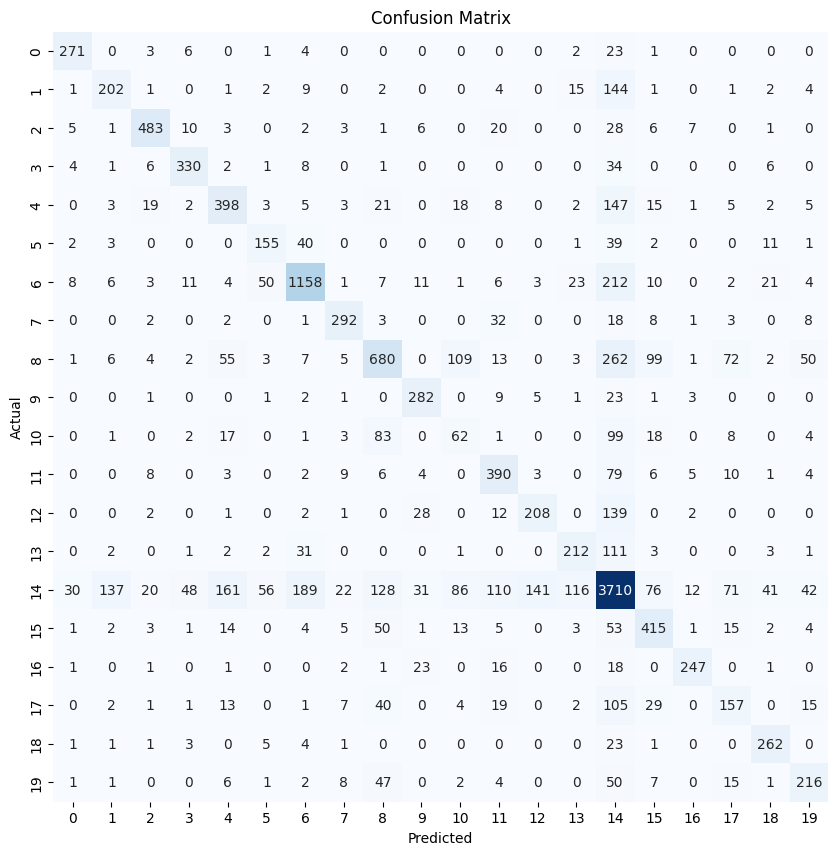

Confusion Matrix for epsilon = 0.8:



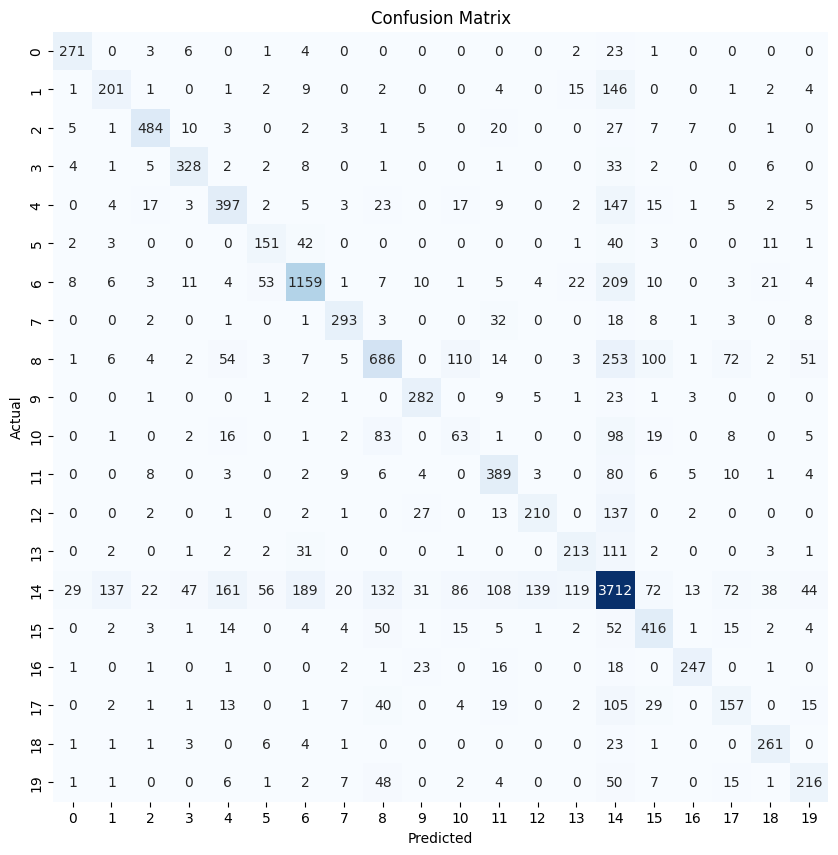

Confusion Matrix for epsilon = 0.9:



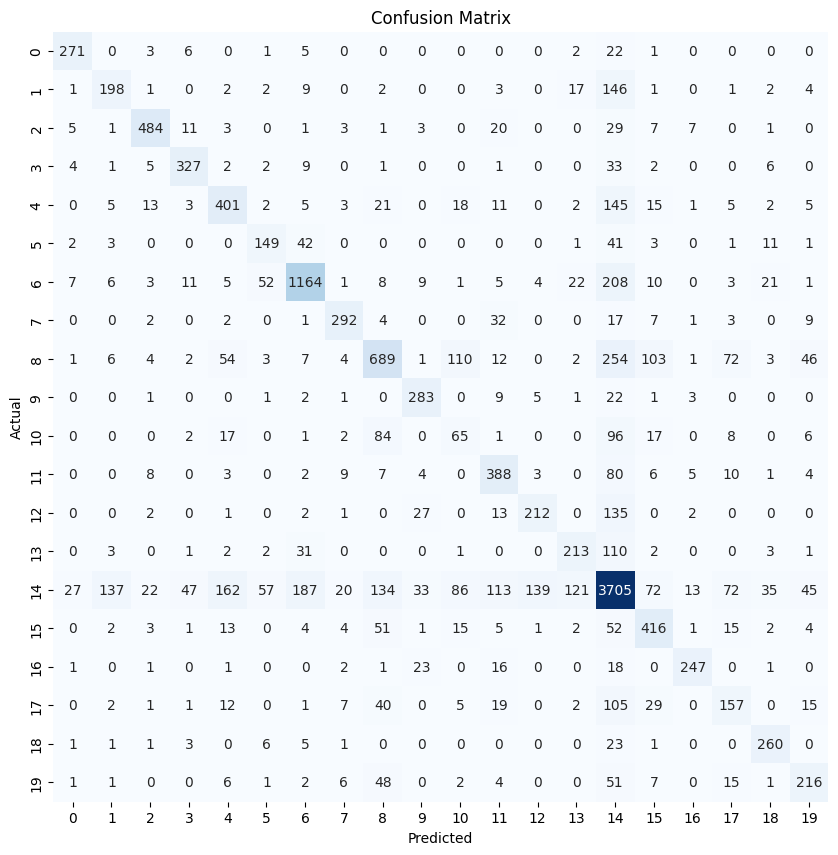

In [ ]:
import torch
from torchmetrics import ConfusionMatrix

# Dictionary to store confusion matrix for each epsilon
confmat_values_by_epsilon = {}

for epsilon, yolo_results_kg in results_by_epsilon.items():
    # Construct preds and target, and move them to the correct device
    preds_yolo_kg = []
    target_yolo_kg = []

    for result in yolo_results_kg:
        preds_yolo_kg.append(
            dict(
                boxes=torch.Tensor(result["pred_boxes"]).to(device),
                scores=torch.Tensor(result["pred_scores"]).to(device),
                labels=torch.Tensor(result["pred_labels"]).int().to(device),
            )
        )

        target_yolo_kg.append(
            dict(
                boxes=torch.Tensor(result["true_boxes"]).to(device),
                labels=torch.Tensor(result["true_labels"]).int().to(device),
            )
        )

    # Determine the maximum number of labels across all images
    max_length = max(max(len(pred['labels']) for pred in preds_yolo_kg), max(len(true['labels']) for true in target_yolo_kg))

    # Define a padding value that does not conflict with existing labels
    padding_value = -1

    # Pad predictions and targets to ensure they have the same length
    padded_preds = []
    padded_targets = []

    for pred, true in zip(preds_yolo_kg, target_yolo_kg):
        pred_labels = pred['labels']
        true_labels = true['labels']

        # Pad the labels to the maximum length
        padded_pred_labels = torch.nn.functional.pad(pred_labels, (0, max_length - len(pred_labels)), value=padding_value)
        padded_true_labels = torch.nn.functional.pad(true_labels, (0, max_length - len(true_labels)), value=padding_value)

        padded_preds.extend(padded_pred_labels.tolist())
        padded_targets.extend(padded_true_labels.tolist())

    # Convert lists to tensors
    all_preds_tensor = torch.tensor(padded_preds).to(device)
    all_targets_tensor = torch.tensor(padded_targets).to(device)

    # Filter out padding values from both predictions and targets
    valid_indices = (all_preds_tensor != padding_value) & (all_targets_tensor != padding_value)
    all_preds_tensor = all_preds_tensor[valid_indices]
    all_targets_tensor = all_targets_tensor[valid_indices]

    # Determine the number of unique classes, excluding the padding value
    num_classes = 20

    # Initialize the ConfusionMatrix metric
    confmat = ConfusionMatrix(task='multiclass', num_classes=num_classes).to(device)

    # Compute the confusion matrix
    confusion_matrix_result = confmat(all_preds_tensor, all_targets_tensor)

    # Store the confusion matrix for this epsilon
    confmat_values_by_epsilon[epsilon] = confusion_matrix_result

    # Print the confusion matrix
    cm = confusion_matrix_result.cpu().numpy()  # Convert to NumPy array for plotting

    print(f"Confusion Matrix for epsilon = {epsilon}:\n")
    # Plot the confusion matrix
    plt.figure(figsize=(10, 10))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
    plt.ylabel("Actual")
    plt.xlabel("Predicted")
    plt.title("Confusion Matrix")
    plt.show()

##YOLO with Knowledge Injection Freq-based Matrix

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
num_iters = 10                 # number of iterations to calculate p_hat
bk = 5                         # number of neighbouring bounding boxes to consider for p_hat
lk = 5                         # number of largest semantic consistent classes to consider for p_hat
topk = 100
matrix_type = 'KF-All-VOC'      # choose between 'KF-All-VOC', 'KF-500-VOC', 'KG-CNet-57-VOC' or 'KG-CNet-55-VOC'
#matrix_type = 'KF-500-VOC'

# load in consistency matrix
path_project = "/content/acarcarkaxhiadiaconu2324-4-adapt-available-implementation"
file_path = os.path.join(path_project, "Semantic Consistency/CM_freq_info.json")

if os.path.isfile(file_path):
      print("Loading frequency based consistency matrix")
      with open(file_path, 'r') as j:
            info = json.load(j)
      KF_All_VOC_info = info['KF_All_VOC_info']
      KF_500_VOC_info = info['KF_500_VOC_info']
      S_KF_All_VOC = np.asarray(KF_All_VOC_info['S'])
      S_KF_500_VOC = np.asarray(KF_500_VOC_info['S'])
else:
       print("No matrix available")


if matrix_type == 'KF-All-VOC':
        S = torch.from_numpy(S_KF_All_VOC).to(device)
elif matrix_type == 'KF-500-VOC':
        S = torch.from_numpy(S_KF_500_VOC).to(device)
else:
        print("Wrong matrix type selected")

Loading frequency based consistency matrix


In [ ]:
from PIL import Image
import numpy as np
import torch
from torchvision import transforms as T

def tensor_to_pil(tensor):
    return T.ToPILImage()(tensor).convert("RGB")

def dict_to_numpy_box(box_dict):
    return np.array([box_dict['xmin'], box_dict['ymin'], box_dict['xmax'], box_dict['ymax']], dtype=np.float32)

def evaluate_model_yolo_freq(model, dataloader, num_classes, device, bk, lk, S, num_iters, epsilon, topk, confidence_threshold=1e-05):
    results = []

    with torch.no_grad():  # Disable gradient calculation
        for images, targets in dataloader:
            # Convert tensor images to PIL images
            pil_images = [tensor_to_pil(image) for image in images]

            # Run inference
            outputs = model.predict(pil_images, conf=confidence_threshold)

            for i, output in enumerate(outputs):
                # Debugging: Check if outputs are generated
                #if len(output.boxes) == 0:
                 #   print(f"No detections for image {i}")

                pred_boxes = output.boxes.xyxy.cpu().numpy()  # Predicted boxes in [x1, y1, x2, y2] format
                pred_scores = torch.tensor(output.boxes.conf.cpu().numpy()).to(device)  # Convert to tensor
                pred_labels = torch.tensor(output.boxes.cls.cpu().numpy()).to(device)  # Convert to tensor

                # Debugging: Print detections info
                #print(f"Image {i}: {len(pred_boxes)} boxes detected")

                # Convert target boxes to numpy arrays
                true_boxes = np.array([dict_to_numpy_box(box) for box in targets[i]['boxes']])
                true_labels = np.array(targets[i]['labels'])

                # Knowledge-based processing
                new_predictions = torch.zeros((pred_boxes.shape[0], num_classes)).to(device)
                for l in range(pred_boxes.shape[0]):
                    label = int(pred_labels[l].item())  # Ensure the label is an integer
                    new_predictions[l, label] = pred_scores[l]

                # Debugging: Print original predictions before knowledge injection
                #print(f"Original Predictions for Image {i}:\n{new_predictions}")

                # Compute knowledge-aware predictions using the consistency matrix
                p_hat = find_p_hat(torch.tensor(pred_boxes).to(device), new_predictions, bk, lk, S, num_iters, epsilon)

                # Debugging: Print knowledge-injected predictions
                #print(f"Knowledge-Injected Predictions (p_hat) for Image {i}:\n{p_hat}")

                # Find top-k predictions based on knowledge-enhanced scores
                predk, boxk, labk, scok = find_top_k(p_hat, torch.tensor(pred_boxes).to(device), topk)
                labk = labk-1

                # Convert tensors back to numpy for final output
                boxk = boxk.cpu().numpy()
                labk = labk.cpu().numpy()
                scok = scok.cpu().numpy()

                # Append results for this image
                results.append({
                    'pred_boxes': boxk,
                    'pred_scores': scok,
                    'pred_labels': labk,
                    'true_boxes': true_boxes,
                    'true_labels': true_labels
                })

    return results


In [ ]:
# List of epsilon values to try
epsilon_values = [0.7, 0.8, 0.9]

# Dictionary to store evaluation results for each epsilon
results_by_epsilon = {}

# Iterate over each epsilon value
for epsilon in epsilon_values:
    print(f"Evaluating with epsilon = {epsilon}")

    # Call the evaluation function with the current epsilon
    yolo_results_freq = evaluate_model_yolo_freq(yolo_model_trained, voc_dataloader, 20, device, bk, lk, S, num_iters, epsilon, topk)

    # Store the results in the dictionary
    results_by_epsilon[epsilon] = yolo_results_freq

In [ ]:
import torch
from torchmetrics.detection.mean_ap import MeanAveragePrecision

# Dictionary to store mAP values for each epsilon
map_values_by_epsilon = {}

for epsilon, yolo_results_freq in results_by_epsilon.items():
    # Construct preds and target, and move them to the correct device
    preds_yolo_freq = []
    target_yolo_freq = []

    for result in yolo_results_freq:
        preds_yolo_freq.append(
            dict(
                boxes=torch.Tensor(result["pred_boxes"]).to(device),
                scores=torch.Tensor(result["pred_scores"]).to(device),
                labels=torch.Tensor(result["pred_labels"]).int().to(device),
            )
        )

        target_yolo_freq.append(
            dict(
                boxes=torch.Tensor(result["true_boxes"]).to(device),
                labels=torch.Tensor(result["true_labels"]).int().to(device),
            )
        )

    # Compute mean average precision
    metric = MeanAveragePrecision(class_metrics=True).to(device)
    metric.update(preds_yolo_freq, target_yolo_freq)
    map_value_yolo_freq = metric.compute()
    map_values_by_epsilon[epsilon] = map_value_yolo_freq

# Print the mAP values for each epsilon, with values displayed vertically
for epsilon, map_value in map_values_by_epsilon.items():
    print(f"mAP for epsilon={epsilon}:")
    for metric, value in map_value.items():
      if torch.is_tensor(value):
         if value.numel() == 1:  # Single-element tensor
             print(f"  {metric}: {value:.4f}")
         else:

             print(f"  {metric}: {value}")
    print()

mAP for epsilon=0.7:
  map: 0.5143
  map_50: 0.7365
  map_75: 0.5674
  map_small: 0.1345
  map_medium: 0.3896
  map_large: 0.6112
  mar_1: 0.4165
  mar_10: 0.6468
  mar_100: 0.6927
  mar_small: 0.2888
  mar_medium: 0.5961
  mar_large: 0.7761
  map_per_class: tensor([0.5381, 0.5688, 0.4592, 0.3384, 0.3764, 0.6502, 0.6065, 0.6226, 0.3577, 0.5558, 0.5067, 0.5728, 0.5929, 0.5434, 0.5649, 0.2681, 0.5102, 0.5044, 0.5787, 0.5697])
  mar_100_per_class: tensor([0.6875, 0.7193, 0.6714, 0.5723, 0.5808, 0.7650, 0.7172, 0.7795, 0.6254, 0.6945, 0.6789, 0.7570, 0.7162, 0.7022, 0.6970, 0.5865, 0.6559, 0.7432, 0.7623, 0.7427])
  classes: tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19], dtype=torch.int32)

mAP for epsilon=0.8:
  map: 0.5152
  map_50: 0.7382
  map_75: 0.5683
  map_small: 0.1350
  map_medium: 0.3906
  map_large: 0.6122
  mar_1: 0.4174
  mar_10: 0.6483
  mar_100: 0.6944
  mar_small: 0.2916
  mar_medium: 0.5997
  mar_large: 0.7768
  map_per_class: ten

In [ ]:
from torchmetrics import Accuracy

# Dictionary to store accuracy values for each epsilon
accuracy_values_by_epsilon = {}

for epsilon, yolo_results_freq in results_by_epsilon.items():
    # Construct preds and target, and move them to the correct device
    preds_yolo_freq = []
    target_yolo_freq = []

    for result in yolo_results_freq:
        preds_yolo_freq.append(
            dict(
                boxes=torch.Tensor(result["pred_boxes"]).to(device),
                scores=torch.Tensor(result["pred_scores"]).to(device),
                labels=torch.Tensor(result["pred_labels"]).int().to(device),
            )
        )

        target_yolo_freq.append(
            dict(
                boxes=torch.Tensor(result["true_boxes"]).to(device),
                labels=torch.Tensor(result["true_labels"]).int().to(device),
            )
        )

    # Determine the maximum number of labels across all images
    max_length = max(max(len(pred['labels']) for pred in preds_yolo_freq), max(len(true['labels']) for true in target_yolo_freq))

    # Define a padding value that does not conflict with existing labels
    padding_value = -1

    # Pad predictions and targets to ensure they have the same length
    padded_preds = []
    padded_targets = []

    for pred, true in zip(preds_yolo_freq, target_yolo_freq):
        pred_labels = pred['labels']
        true_labels = true['labels']

        # Pad the labels to the maximum length
        padded_pred_labels = torch.nn.functional.pad(pred_labels, (0, max_length - len(pred_labels)), value=padding_value)
        padded_true_labels = torch.nn.functional.pad(true_labels, (0, max_length - len(true_labels)), value=padding_value)

        padded_preds.extend(padded_pred_labels.tolist())
        padded_targets.extend(padded_true_labels.tolist())

    # Convert lists to tensors
    all_preds_tensor = torch.tensor(padded_preds).to(device)
    all_targets_tensor = torch.tensor(padded_targets).to(device)

    # Filter out padding values from both predictions and targets
    valid_indices = (all_preds_tensor != padding_value) & (all_targets_tensor != padding_value)
    all_preds_tensor = all_preds_tensor[valid_indices]
    all_targets_tensor = all_targets_tensor[valid_indices]

    # Determine the number of unique classes, excluding the padding value
    num_classes = 20

    # Initialize the Accuracy metric with `average=None` to get per-class accuracy
    accuracy = Accuracy(task='multiclass', num_classes=num_classes, average=None).to(device)

    # Compute the accuracy for each class
    per_class_accuracy = accuracy(all_preds_tensor, all_targets_tensor)

    # Store the accuracy values for this epsilon
    accuracy_values_by_epsilon[epsilon] = per_class_accuracy
    # Print the accuracy for each class
    print(f"Epsilon = {epsilon}")
    for i, acc in enumerate(per_class_accuracy):
       print(f"Accuracy for class {i}: {acc.item() * 100:.2f}%")

Epsilon = 0.7
Accuracy for class 0: 87.14%
Accuracy for class 1: 50.90%
Accuracy for class 2: 84.03%
Accuracy for class 3: 83.21%
Accuracy for class 4: 60.88%
Accuracy for class 5: 57.87%
Accuracy for class 6: 75.41%
Accuracy for class 7: 78.92%
Accuracy for class 8: 50.36%
Accuracy for class 9: 86.02%
Accuracy for class 10: 21.74%
Accuracy for class 11: 73.21%
Accuracy for class 12: 53.67%
Accuracy for class 13: 57.99%
Accuracy for class 14: 70.65%
Accuracy for class 15: 70.44%
Accuracy for class 16: 79.42%
Accuracy for class 17: 39.90%
Accuracy for class 18: 86.42%
Accuracy for class 19: 59.83%
Epsilon = 0.8
Accuracy for class 0: 87.14%
Accuracy for class 1: 50.64%
Accuracy for class 2: 84.38%
Accuracy for class 3: 82.95%
Accuracy for class 4: 61.04%
Accuracy for class 5: 58.27%
Accuracy for class 6: 75.54%
Accuracy for class 7: 78.92%
Accuracy for class 8: 50.36%
Accuracy for class 9: 86.02%
Accuracy for class 10: 21.74%
Accuracy for class 11: 73.21%
Accuracy for class 12: 53.92%
Ac

Confusion Matrix for epsilon = 0.7:



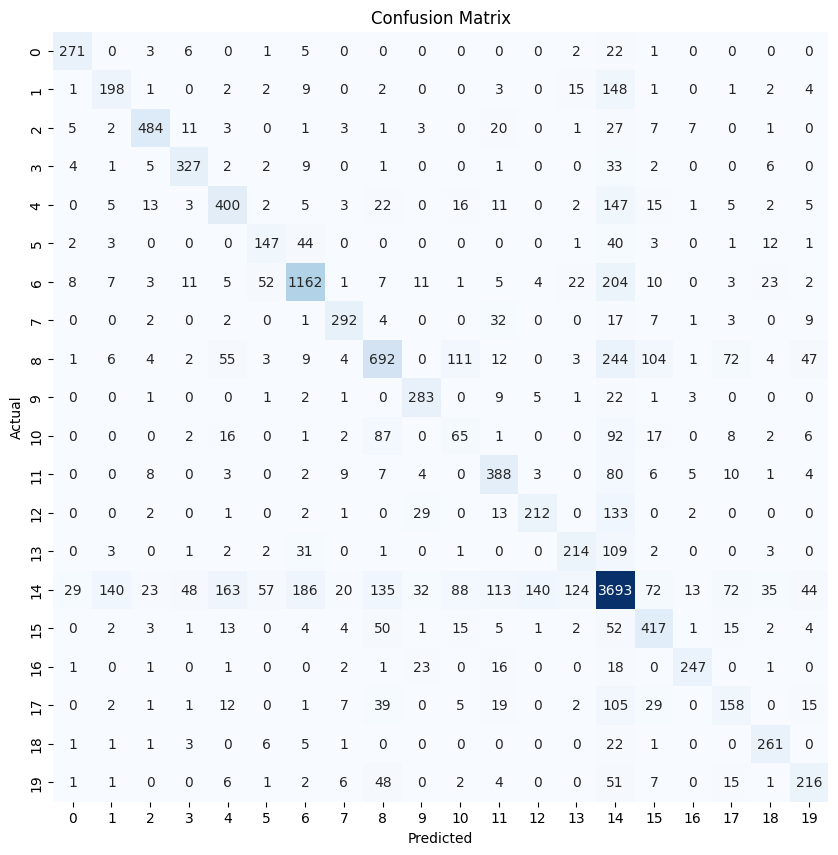

Confusion Matrix for epsilon = 0.8:



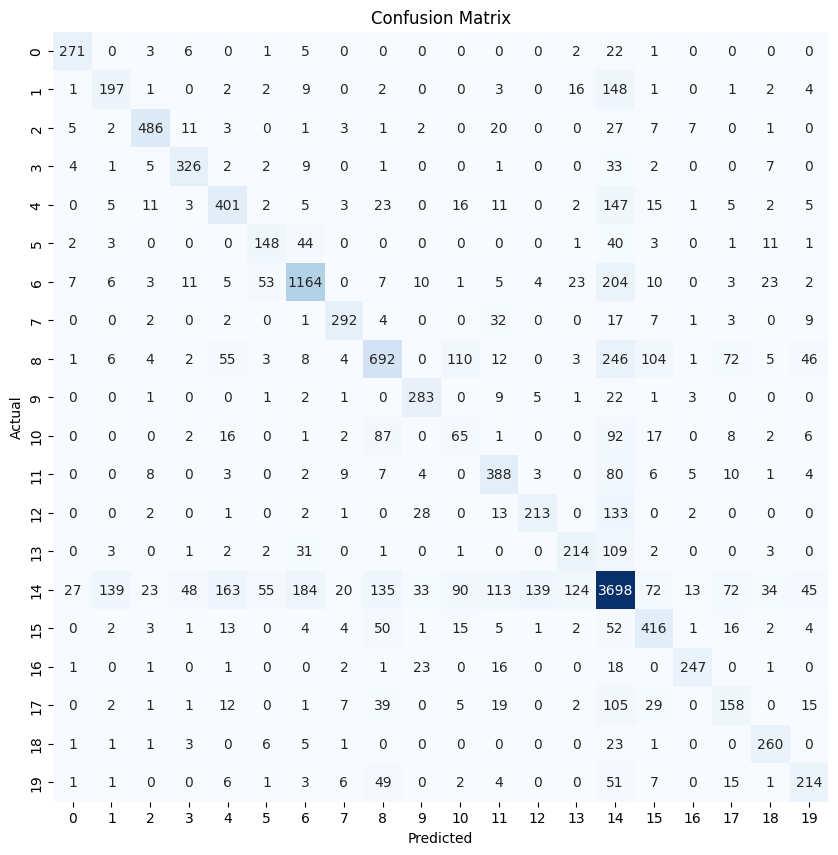

Confusion Matrix for epsilon = 0.9:



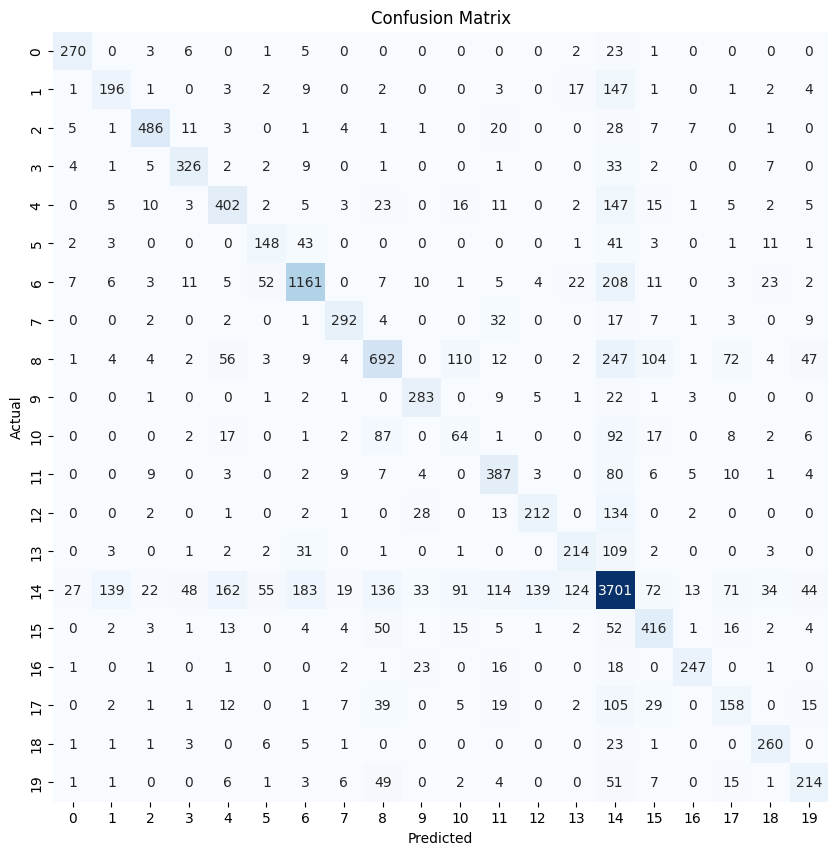

In [ ]:
import torch
from torchmetrics import ConfusionMatrix

# Dictionary to store confusion matrix for each epsilon
confmat_values_by_epsilon = {}

for epsilon, yolo_results_freq in results_by_epsilon.items():
    # Construct preds and target, and move them to the correct device
    preds_yolo_freq = []
    target_yolo_freq = []

    for result in yolo_results_freq:
        preds_yolo_freq.append(
            dict(
                boxes=torch.Tensor(result["pred_boxes"]).to(device),
                scores=torch.Tensor(result["pred_scores"]).to(device),
                labels=torch.Tensor(result["pred_labels"]).int().to(device),
            )
        )

        target_yolo_freq.append(
            dict(
                boxes=torch.Tensor(result["true_boxes"]).to(device),
                labels=torch.Tensor(result["true_labels"]).int().to(device),
            )
        )

    # Determine the maximum number of labels across all images
    max_length = max(max(len(pred['labels']) for pred in preds_yolo_freq), max(len(true['labels']) for true in target_yolo_freq))

    # Define a padding value that does not conflict with existing labels
    padding_value = -1

    # Pad predictions and targets to ensure they have the same length
    padded_preds = []
    padded_targets = []

    for pred, true in zip(preds_yolo_freq, target_yolo_freq):
        pred_labels = pred['labels']
        true_labels = true['labels']

        # Pad the labels to the maximum length
        padded_pred_labels = torch.nn.functional.pad(pred_labels, (0, max_length - len(pred_labels)), value=padding_value)
        padded_true_labels = torch.nn.functional.pad(true_labels, (0, max_length - len(true_labels)), value=padding_value)

        padded_preds.extend(padded_pred_labels.tolist())
        padded_targets.extend(padded_true_labels.tolist())

    # Convert lists to tensors
    all_preds_tensor = torch.tensor(padded_preds).to(device)
    all_targets_tensor = torch.tensor(padded_targets).to(device)

    # Filter out padding values from both predictions and targets
    valid_indices = (all_preds_tensor != padding_value) & (all_targets_tensor != padding_value)
    all_preds_tensor = all_preds_tensor[valid_indices]
    all_targets_tensor = all_targets_tensor[valid_indices]

    # Determine the number of unique classes, excluding the padding value
    num_classes = 20

    # Initialize the ConfusionMatrix metric
    confmat = ConfusionMatrix(task='multiclass', num_classes=num_classes).to(device)

    # Compute the confusion matrix
    confusion_matrix_result = confmat(all_preds_tensor, all_targets_tensor)

    # Store the confusion matrix for this epsilon
    confmat_values_by_epsilon[epsilon] = confusion_matrix_result

    # Print the confusion matrix
    cm = confusion_matrix_result.cpu().numpy()  # Convert to NumPy array for plotting

    print(f"Confusion Matrix for epsilon = {epsilon}:\n")
    # Plot the confusion matrix
    plt.figure(figsize=(10, 10))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
    plt.ylabel("Actual")
    plt.xlabel("Predicted")
    plt.title("Confusion Matrix")
    plt.show()

###KF-500-VOC

In [ ]:
num_iters = 10                 # number of iterations to calculate p_hat
bk = 5                         # number of neighbouring bounding boxes to consider for p_hat
lk = 5                         # number of largest semantic consistent classes to consider for p_hat
topk = 100
#matrix_type = 'KF-All-VOC'      # choose between 'KF-All-VOC', 'KF-500-VOC', 'KG-CNet-57-VOC' or 'KG-CNet-55-VOC'
matrix_type = 'KF-500-VOC'

# load in consistency matrix
path_project = "/content/acarcarkaxhiadiaconu2324-4-adapt-available-implementation"
file_path = os.path.join(path_project, "Semantic Consistency/CM_freq_info.json")

if os.path.isfile(file_path):
      print("Loading frequency based consistency matrix")
      with open(file_path, 'r') as j:
            info = json.load(j)
      KF_All_VOC_info = info['KF_All_VOC_info']
      KF_500_VOC_info = info['KF_500_VOC_info']
      S_KF_All_VOC = np.asarray(KF_All_VOC_info['S'])
      S_KF_500_VOC = np.asarray(KF_500_VOC_info['S'])
else:
       print("No matrix available")


if matrix_type == 'KF-All-VOC':
        S = torch.from_numpy(S_KF_All_VOC).to(device)
elif matrix_type == 'KF-500-VOC':
        S = torch.from_numpy(S_KF_500_VOC).to(device)
else:
        print("Wrong matrix type selected")

Loading frequency based consistency matrix


In [ ]:
# List of epsilon values to try
epsilon_values = [0.7, 0.8, 0.9]

# Dictionary to store evaluation results for each epsilon
results_by_epsilon_500 = {}

# Iterate over each epsilon value
for epsilon in epsilon_values:
    print(f"Evaluating with epsilon = {epsilon}")

    # Call the evaluation function with the current epsilon
    yolo_results_freq_500 = evaluate_model_yolo_freq(yolo_model_trained, voc_dataloader, 20, device, bk, lk, S, num_iters, epsilon, topk)

    # Store the results in the dictionary
    results_by_epsilon_500[epsilon] = yolo_results_freq_500

In [ ]:
import torch
from torchmetrics.detection.mean_ap import MeanAveragePrecision

# Dictionary to store mAP values for each epsilon
map_values_by_epsilon_500 = {}

for epsilon, yolo_results_freq in results_by_epsilon_500.items():
    # Construct preds and target, and move them to the correct device
    preds_yolo_freq_500 = []
    target_yolo_freq_500 = []

    for result in yolo_results_freq:
        preds_yolo_freq_500.append(
            dict(
                boxes=torch.Tensor(result["pred_boxes"]).to(device),
                scores=torch.Tensor(result["pred_scores"]).to(device),
                labels=torch.Tensor(result["pred_labels"]).int().to(device),
            )
        )

        target_yolo_freq_500.append(
            dict(
                boxes=torch.Tensor(result["true_boxes"]).to(device),
                labels=torch.Tensor(result["true_labels"]).int().to(device),
            )
        )

    # Compute mean average precision
    metric = MeanAveragePrecision(class_metrics=True).to(device)
    metric.update(preds_yolo_freq_500, target_yolo_freq_500)
    map_value_yolo_freq_500 = metric.compute()
    map_values_by_epsilon_500[epsilon] = map_value_yolo_freq_500

# Print the mAP values for each epsilon, with values displayed vertically
for epsilon, map_value in map_values_by_epsilon_500.items():
    print(f"mAP for epsilon={epsilon}:")
    for metric, value in map_value.items():
      if torch.is_tensor(value):
         if value.numel() == 1:  # Single-element tensor
             print(f"  {metric}: {value:.4f}")
         else:

             print(f"  {metric}: {value}")
    print()

mAP for epsilon=0.7:
  map: 0.5132
  map_50: 0.7348
  map_75: 0.5662
  map_small: 0.1339
  map_medium: 0.3888
  map_large: 0.6101
  mar_1: 0.4164
  mar_10: 0.6448
  mar_100: 0.6908
  mar_small: 0.2864
  mar_medium: 0.5962
  mar_large: 0.7740
  map_per_class: tensor([0.5294, 0.5673, 0.4581, 0.3379, 0.3763, 0.6508, 0.6063, 0.6212, 0.3574, 0.5552, 0.5069, 0.5725, 0.5863, 0.5449, 0.5644, 0.2682, 0.5088, 0.5034, 0.5770, 0.5709])
  mar_100_per_class: tensor([0.6881, 0.7157, 0.6722, 0.5613, 0.5785, 0.7673, 0.7177, 0.7827, 0.6192, 0.6924, 0.6739, 0.7575, 0.7185, 0.6970, 0.6939, 0.5872, 0.6518, 0.7414, 0.7616, 0.7371])
  classes: tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19], dtype=torch.int32)

mAP for epsilon=0.8:
  map: 0.5145
  map_50: 0.7369
  map_75: 0.5676
  map_small: 0.1347
  map_medium: 0.3899
  map_large: 0.6113
  mar_1: 0.4169
  mar_10: 0.6469
  mar_100: 0.6925
  mar_small: 0.2893
  mar_medium: 0.5978
  mar_large: 0.7749
  map_per_class: ten

Epsilon = 0.7
Accuracy for class 0: 87.78%
Accuracy for class 1: 50.90%
Accuracy for class 2: 84.03%
Accuracy for class 3: 83.21%
Accuracy for class 4: 60.73%
Accuracy for class 5: 58.27%
Accuracy for class 6: 75.47%
Accuracy for class 7: 78.92%
Accuracy for class 8: 50.15%
Accuracy for class 9: 86.02%
Accuracy for class 10: 21.74%
Accuracy for class 11: 73.21%
Accuracy for class 12: 54.43%
Accuracy for class 13: 57.99%
Accuracy for class 14: 70.50%
Accuracy for class 15: 70.44%
Accuracy for class 16: 79.42%
Accuracy for class 17: 39.90%
Accuracy for class 18: 86.42%
Accuracy for class 19: 59.00%


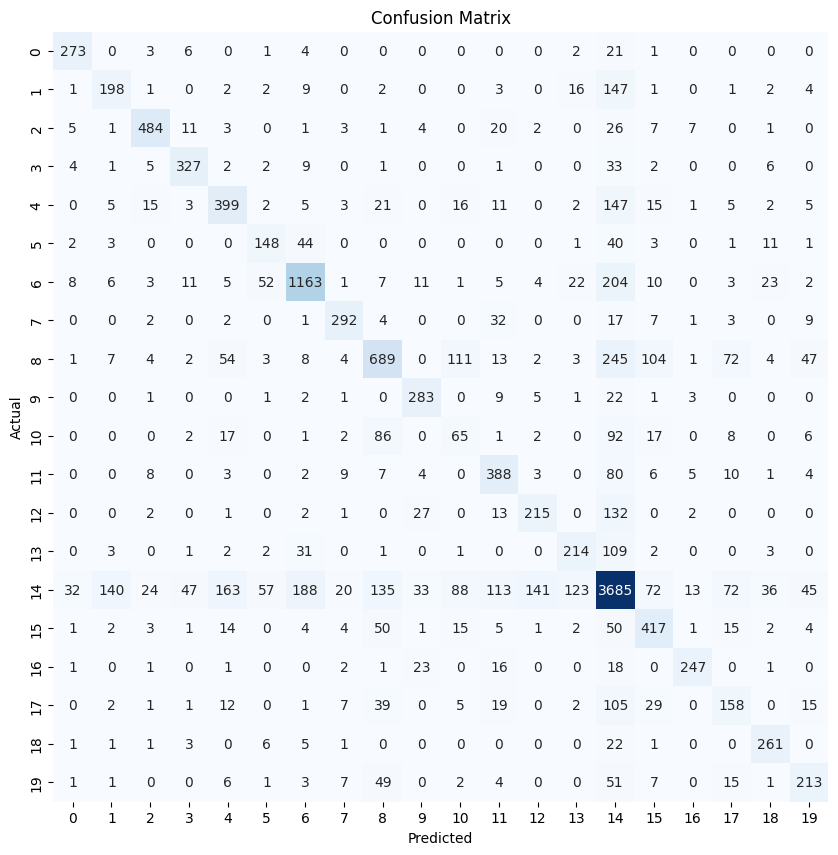

Epsilon = 0.8
Accuracy for class 0: 87.46%
Accuracy for class 1: 50.64%
Accuracy for class 2: 84.20%
Accuracy for class 3: 82.95%
Accuracy for class 4: 60.73%
Accuracy for class 5: 58.27%
Accuracy for class 6: 75.54%
Accuracy for class 7: 78.92%
Accuracy for class 8: 50.36%
Accuracy for class 9: 86.02%
Accuracy for class 10: 21.74%
Accuracy for class 11: 73.21%
Accuracy for class 12: 54.43%
Accuracy for class 13: 57.99%
Accuracy for class 14: 70.69%
Accuracy for class 15: 70.27%
Accuracy for class 16: 79.42%
Accuracy for class 17: 39.90%
Accuracy for class 18: 86.09%
Accuracy for class 19: 59.28%


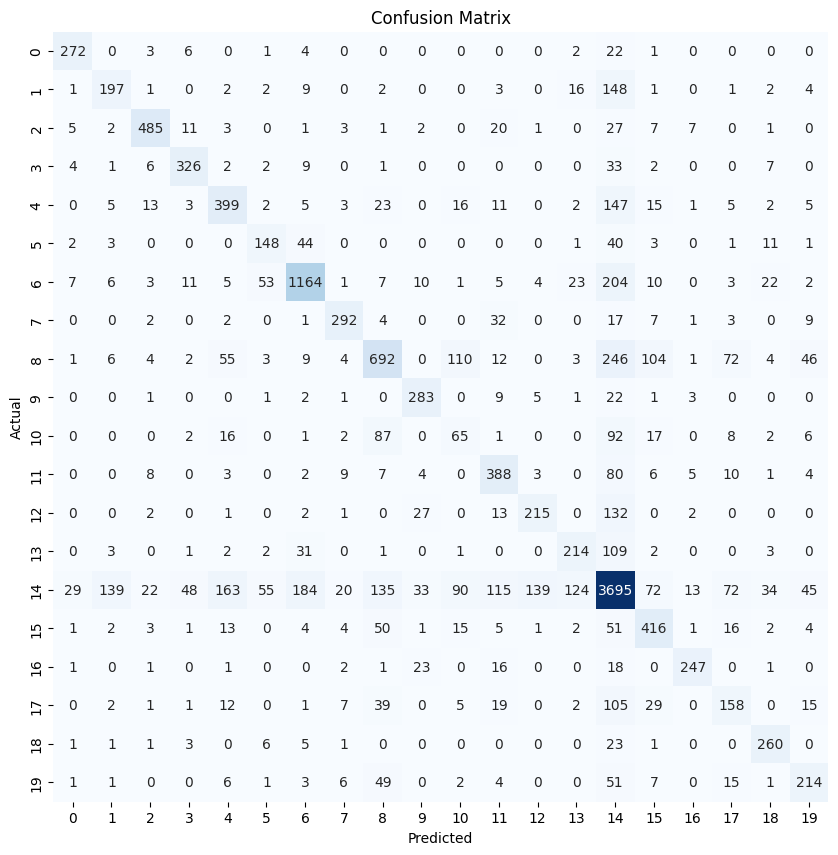

In [ ]:
from torchmetrics import Accuracy

# Dictionary to store accuracy values for each epsilon
accuracy_values_by_epsilon_500 = {}
confmat_values_by_epsilon_500 = {}

for epsilon, yolo_results_freq in results_by_epsilon_500.items():
    # Construct preds and target, and move them to the correct device
    preds_yolo_freq_500 = []
    target_yolo_freq_500 = []

    for result in yolo_results_freq:
        preds_yolo_freq_500.append(
            dict(
                boxes=torch.Tensor(result["pred_boxes"]).to(device),
                scores=torch.Tensor(result["pred_scores"]).to(device),
                labels=torch.Tensor(result["pred_labels"]).int().to(device),
            )
        )

        target_yolo_freq_500.append(
            dict(
                boxes=torch.Tensor(result["true_boxes"]).to(device),
                labels=torch.Tensor(result["true_labels"]).int().to(device),
            )
        )

    # Determine the maximum number of labels across all images
    max_length = max(max(len(pred['labels']) for pred in preds_yolo_freq_500), max(len(true['labels']) for true in target_yolo_freq_500))

    # Define a padding value that does not conflict with existing labels
    padding_value = -1

    # Pad predictions and targets to ensure they have the same length
    padded_preds = []
    padded_targets = []

    for pred, true in zip(preds_yolo_freq_500, target_yolo_freq_500):
        pred_labels = pred['labels']
        true_labels = true['labels']

        # Pad the labels to the maximum length
        padded_pred_labels = torch.nn.functional.pad(pred_labels, (0, max_length - len(pred_labels)), value=padding_value)
        padded_true_labels = torch.nn.functional.pad(true_labels, (0, max_length - len(true_labels)), value=padding_value)

        padded_preds.extend(padded_pred_labels.tolist())
        padded_targets.extend(padded_true_labels.tolist())

    # Convert lists to tensors
    all_preds_tensor = torch.tensor(padded_preds).to(device)
    all_targets_tensor = torch.tensor(padded_targets).to(device)

    # Filter out padding values from both predictions and targets
    valid_indices = (all_preds_tensor != padding_value) & (all_targets_tensor != padding_value)
    all_preds_tensor = all_preds_tensor[valid_indices]
    all_targets_tensor = all_targets_tensor[valid_indices]

    # Determine the number of unique classes, excluding the padding value
    num_classes = 20

    # Initialize the Accuracy metric with `average=None` to get per-class accuracy
    accuracy = Accuracy(task='multiclass', num_classes=num_classes, average=None).to(device)

    # Compute the accuracy for each class
    per_class_accuracy = accuracy(all_preds_tensor, all_targets_tensor)

    # Store the accuracy values for this epsilon
    accuracy_values_by_epsilon_500[epsilon] = per_class_accuracy
    # Print the accuracy for each class
    print(f"Epsilon = {epsilon}")
    for i, acc in enumerate(per_class_accuracy):
       print(f"Accuracy for class {i}: {acc.item() * 100:.2f}%")

    # Initialize the ConfusionMatrix metric
    confmat = ConfusionMatrix(task='multiclass', num_classes=num_classes).to(device)

    # Compute the confusion matrix
    confusion_matrix_result = confmat(all_preds_tensor, all_targets_tensor)

    # Store the confusion matrix for this epsilon
    confmat_values_by_epsilon_500[epsilon] = confusion_matrix_result

    # Print the confusion matrix
    cm = confusion_matrix_result.cpu().numpy()  # Convert to NumPy array for plotting

    # Plot the confusion matrix
    plt.figure(figsize=(10, 10))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
    plt.ylabel("Actual")
    plt.xlabel("Predicted")
    plt.title("Confusion Matrix")
    plt.show()